## Business Problem

## Import Packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style='whitegrid')
import warnings 
warnings.filterwarnings('ignore')
import pandas_profiling
from scipy.stats import zscore
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier 
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
import xgboost
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler,PowerTransformer,LabelEncoder
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import accuracy_score,roc_auc_score,classification_report,confusion_matrix,roc_curve,auc,plot_roc_curve
plt.style.use('ggplot')
#Module related to VIF 
from statsmodels.stats.outliers_influence import variance_inflation_factor
#Moudles related to feature selection
from sklearn.feature_selection import RFE,SelectKBest,f_classif

## Create UDFs

In [2]:
# Create Data audit Report for continuous variables
def continuous_var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(),  
                      x.std(), x.var(), x.min(), x.quantile(0.01), x.quantile(0.05),
                          x.quantile(0.10),x.quantile(0.25),x.quantile(0.50),x.quantile(0.75), 
                              x.quantile(0.90),x.quantile(0.95), x.quantile(0.99),x.max()], 
                  index = ['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'MIN', 'P1', 
                               'P5' ,'P10' ,'P25' ,'P50' ,'P75' ,'P90' ,'P95' ,'P99' ,'MAX'])

## Import Data

In [3]:
df = pd.read_csv('E:/DataTrained/Intership_Flip Robo/final_projects/Automobile_insurance_fraud.csv') 
pd.set_option('display.max_columns',None)
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


## Data Inspection

In [4]:
#profile = pandas_profiling.ProfileReport(df)
#profile.to_widgets()

In [5]:
# data informatiion
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

##### The dataset have 21 object, 17 int64 and 2 float 64

In [6]:
# converting date varibales to datetime type
df['policy_bind_date'] =  pd.to_datetime(df['policy_bind_date'])
df['incident_date'] =  pd.to_datetime(df['incident_date'])

In [7]:
# check types again
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   months_as_customer           1000 non-null   int64         
 1   age                          1000 non-null   int64         
 2   policy_number                1000 non-null   int64         
 3   policy_bind_date             1000 non-null   datetime64[ns]
 4   policy_state                 1000 non-null   object        
 5   policy_csl                   1000 non-null   object        
 6   policy_deductable            1000 non-null   int64         
 7   policy_annual_premium        1000 non-null   float64       
 8   umbrella_limit               1000 non-null   int64         
 9   insured_zip                  1000 non-null   int64         
 10  insured_sex                  1000 non-null   object        
 11  insured_education_level      1000 non-null  

In [8]:
#checking the shape of dataset
df.shape

(1000, 40)

##### We have 1000 rows and 40 columns in our dataset.

In [9]:
# Value counts for every feature to check the missing again or unique values
for i in df.columns:
    print(df[i].value_counts())
    print('**********************************')

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64
**********************************
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64
**********************************
521585    1
687755    1
674485    1
223404    1
991480    1
         ..
563878    1
620855    1
583169    1
337677    1
556080    1
Name: policy_number, Length: 1000, dtype: int64
**********************************
2006-01-01    3
1992-04-28    3
1992-05-08    3
1991-12-14    2
2004-09-08    2
             ..
2014-03-06    1
1998-12-12    

##### Collision_type have 178 records with ?  , property_damage have 360 records with ?  , police_report_available have 343 records with ?  we need to treat that by replacing it with mode.

#####  _c39 feature have NAN in the all records. so we will drop it.

In [10]:
# fill the empty records  
df['collision_type']=df.collision_type.str.replace('?','Rear Collision')
df['property_damage']=df.property_damage.str.replace('?','NO')
df['police_report_available']=df.police_report_available.str.replace('?','NO')

In [11]:
# check agian
for i in df.columns:
    print(df[i].value_counts())
    print('**********************************')

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64
**********************************
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64
**********************************
521585    1
687755    1
674485    1
223404    1
991480    1
         ..
563878    1
620855    1
583169    1
337677    1
556080    1
Name: policy_number, Length: 1000, dtype: int64
**********************************
2006-01-01    3
1992-04-28    3
1992-05-08    3
1991-12-14    2
2004-09-08    2
             ..
2014-03-06    1
1998-12-12    

In [12]:
#lets check no. of unique values present in each column. 

df.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    3
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

In [13]:
# drop   _c39,policy_number and incident_location and insured_zip features
df.drop(['_c39','policy_number','incident_location','insured_zip'],axis=1,inplace=True)

In [14]:
# drop umbrella_limit as it have >70% of zero values.
df.drop('umbrella_limit',axis=1,inplace=True)

In [15]:
#Extracting columns from policy_csl
df['csl_per_person'] = df.policy_csl.str.split('/', expand=True)[0]
df['csl_per_accident'] = df.policy_csl.str.split('/', expand=True)[1]

#policy_csl was object type data before now i have to convert extracted data from object to int dtype.

#Changing dtype of extracted column
df[['csl_per_person']] = df[['csl_per_person']].astype('int64')
df[['csl_per_accident']] = df[['csl_per_accident']].astype('int64')

In [16]:
#Extracting policy_bind year,month and day from policy_bind_date

df["policy_bind_year"]=pd.to_datetime(df.policy_bind_date).dt.year
df["policy_bind_month"]=pd.to_datetime(df.policy_bind_date).dt.month
df["policy_bind_day"]=pd.to_datetime(df.policy_bind_date).dt.day

In [17]:
#Extracting incident year,month and day from incident_date

df["incident_year"]=pd.to_datetime(df.incident_date).dt.year
df["incident_month"]=pd.to_datetime(df.incident_date).dt.month
df["incident_day"]=pd.to_datetime(df.incident_date).dt.day

In [18]:
#Droping policy_csl and policy_bind_date column 
df.drop(['policy_csl','policy_bind_date','incident_date'],axis=1,inplace=True)

In [19]:
# check the uniques value agains
df.nunique()

months_as_customer             391
age                             46
policy_state                     3
policy_deductable                3
policy_annual_premium          991
insured_sex                      2
insured_education_level          7
insured_occupation              14
insured_hobbies                 20
insured_relationship             6
capital-gains                  338
capital-loss                   354
incident_type                    4
collision_type                   3
incident_severity                4
authorities_contacted            5
incident_state                   7
incident_city                    7
incident_hour_of_the_day        24
number_of_vehicles_involved      4
property_damage                  2
bodily_injuries                  3
witnesses                        4
police_report_available          2
total_claim_amount             763
injury_claim                   638
property_claim                 626
vehicle_claim                  726
auto_make           

In [20]:
#Droping incident_year as it's uniform

df.drop('incident_year',axis=1,inplace=True)

In [21]:
# Check null values in  data
df.isnull().sum()

months_as_customer             0
age                            0
policy_state                   0
policy_deductable              0
policy_annual_premium          0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_claim                   0
property_claim                 0
vehicle_claim                  0
auto_make                      0
auto_model                     0
auto_year 

##### There are no missing values.

In [22]:
# Check imbalance of the target data
df.fraud_reported.value_counts(normalize=True)

N    0.753
Y    0.247
Name: fraud_reported, dtype: float64

##### It's is not balnaced so we will using SMOTE technique later.

In [23]:
# split train data to numerical and categorical varaiables.
num=df.select_dtypes(include=['float64','int64'])
cat=df.select_dtypes(include=['object'])

In [24]:
# Descriptive analysis for continous data
num.apply(continuous_var_summary)

,months_as_customer,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,csl_per_person,csl_per_accident,policy_bind_year,policy_bind_month,policy_bind_day,incident_month,incident_day
N,1000.000000,1000.000000,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000
NMISS,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
SUM,203954.000000,38948.000000,1.136000e+06,1.256406e+06,2.512610e+07,-2.679370e+07,11644.000000,1839.000000,992.000000,1487.000000,5.276194e+07,7.433420e+06,7.399570e+06,3.792895e+07,2.005103e+06,272650.000000,580200.000000,2.001604e+06,6559.000000,15448.000000,3407.000000,13084.000000
MEAN,203.954000,38.948000,1.136000e+03,1.256406e+03,2.512610e+04,-2.679370e+04,11.644000,1.839000,0.992000,1.487000,5.276194e+04,7.433420e+03,7.399570e+03,3.792895e+04,2.005103e+03,272.650000,580.200000,2.001604e+03,6.559000,15.448000,3.407000,13.084000
MEDIAN,199.500000,38.000000,1.000000e+03,1.257200e+03,0.000000e+00,-2.325000e+04,12.000000,1.000000,1.000000,1.000000,5.805500e+04,6.775000e+03,6.750000e+03,4.210000e+04,2.005000e+03,250.000000,500.000000,2.002000e+03,7.000000,16.000000,2.000000,15.000000
STD,115.113174,9.140287,6.118647e+02,2.441674e+02,2.787219e+04,2.810410e+04,6.951373,1.018880,0.820127,1.111335,2.640153e+04,4.880952e+03,4.824726e+03,1.888625e+04,6.015861e+00,161.603196,287.420547,7.360391e+00,3.391758,8.850176,3.276291,10.443180
VAR,13251.042927,83.544841,3.743784e+05,5.961772e+04,7.768588e+08,7.898403e+08,48.321586,1.038117,0.672609,1.235066,6.970410e+08,2.382369e+07,2.327798e+07,3.566905e+08,3.619058e+01,26115.593093,82610.570571,5.417536e+01,11.504023,78.325622,10.734085,109.060004
MIN,0.000000,19.000000,5.000000e+02,4.333300e+02,0.000000e+00,-1.111000e+05,0.000000,1.000000,0.000000,0.000000,1.000000e+02,0.000000e+00,0.000000e+00,7.000000e+01,1.995000e+03,100.000000,300.000000,1.990000e+03,1.000000,1.000000,1.000000,1.000000
P1,4.000000,23.000000,5.000000e+02,6.942247e+02,0.000000e+00,-8.591400e+04,0.000000,1.000000,0.000000,0.000000,2.699400e+03,0.000000e+00,0.000000e+00,1.979800e+03,1.995000e+03,100.000000,300.000000,1.990000e+03,1.000000,1.000000,1.000000,1.000000
P5,28.900000,26.000000,5.000000e+02,8.551120e+02,0.000000e+00,-7.230500e+04,0.000000,1.000000,0.000000,0.000000,4.320000e+03,4.500000e+02,4.500000e+02,3.273500e+03,1.995000e+03,100.000000,300.000000,1.991000e+03,1.000000,2.000000,1.000000,1.000000


Mean and median of numerical columns are different. Skewness is present

In [25]:
# Descriptive analysis for categorical data
cat.describe(include='O')

,policy_state,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported
count,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
unique,3,2,7,14,20,6,4,3,4,5,7,7,2,2,14,39,2
top,OH,FEMALE,JD,machine-op-inspct,reading,own-child,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Springfield,NO,NO,Saab,RAM,N
freq,352,537,161,93,64,183,419,470,354,292,262,157,698,686,80,43,753


-------------------------------------------------------------------------------------------------------------------------------

## EDA

#### Univariate analysis

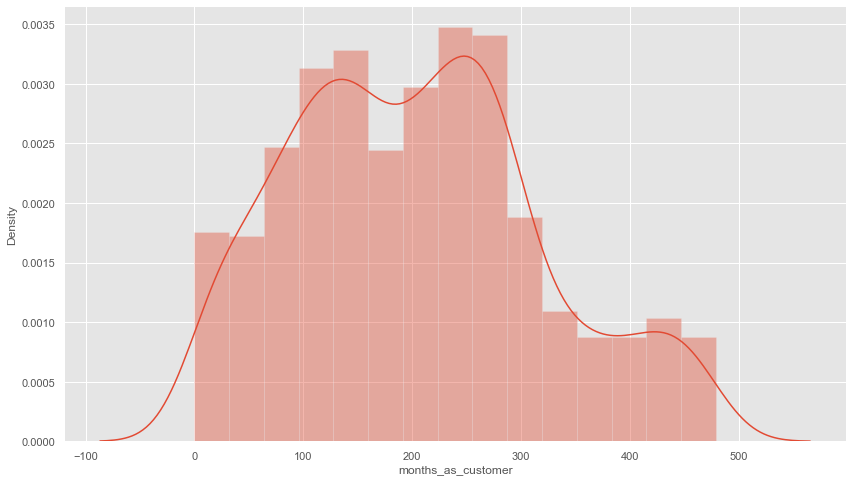

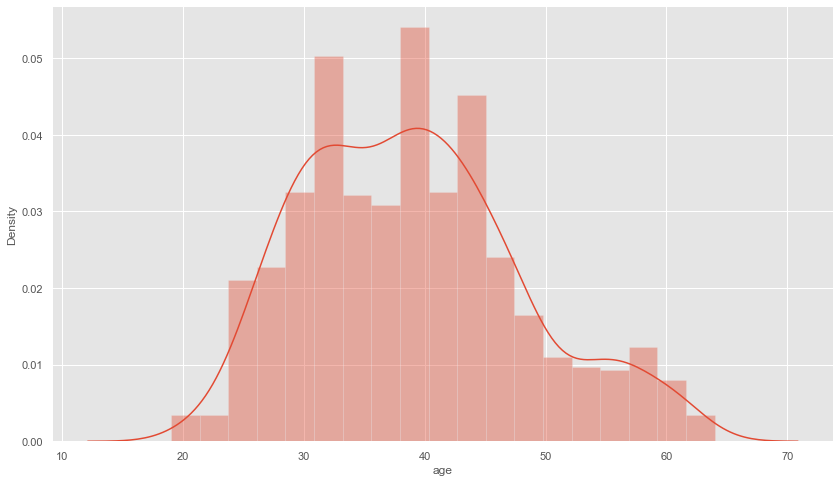

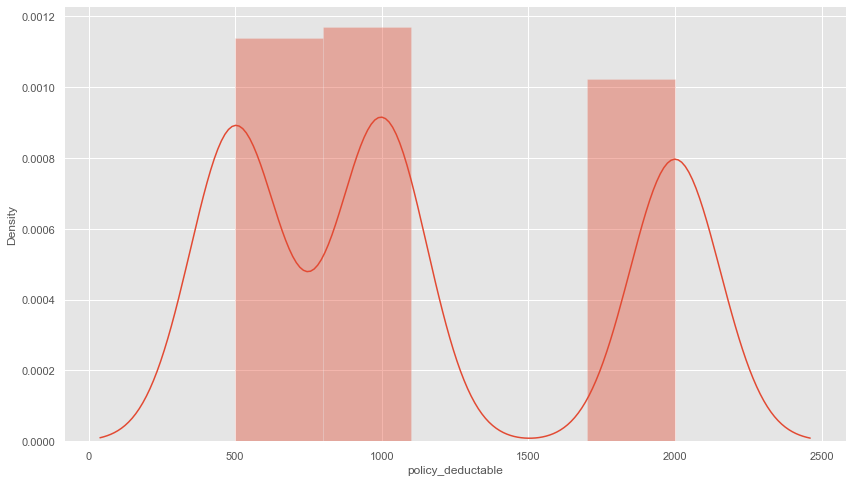

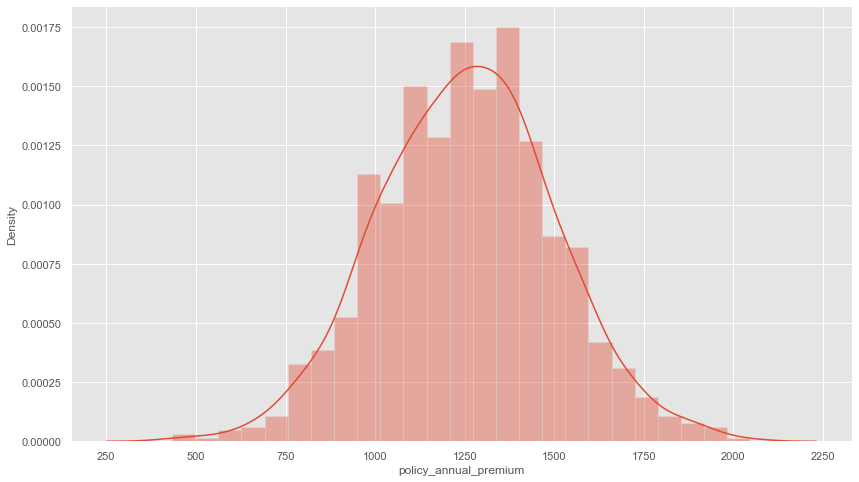

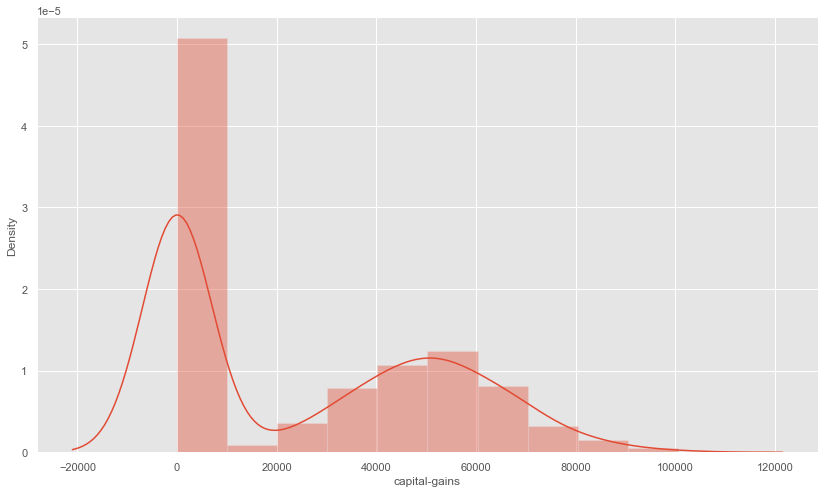

...

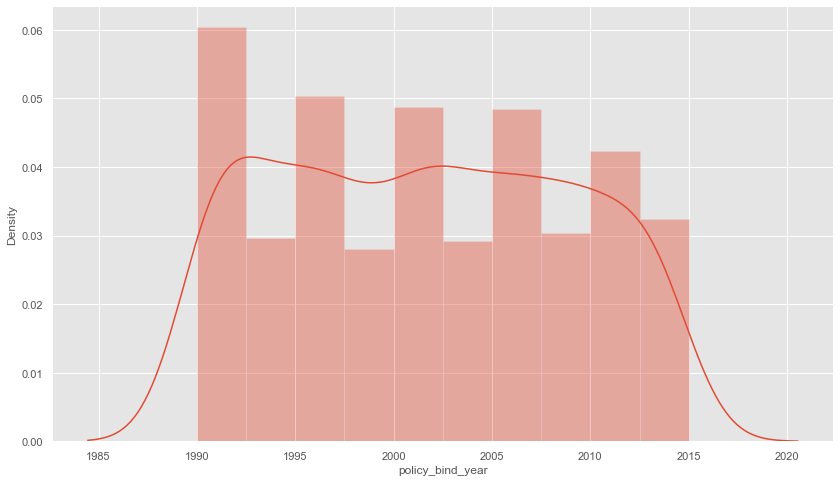

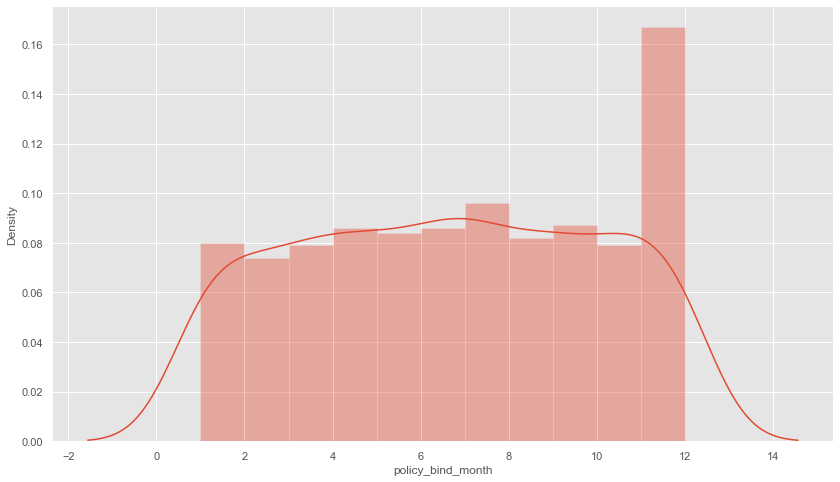

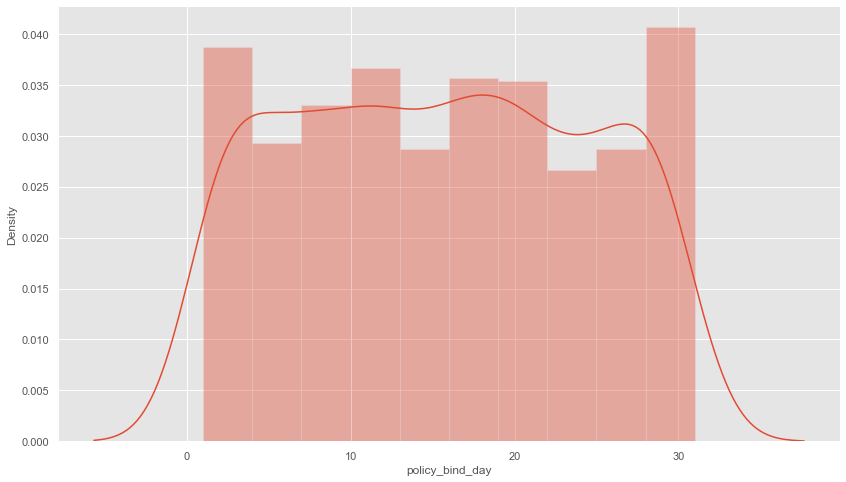

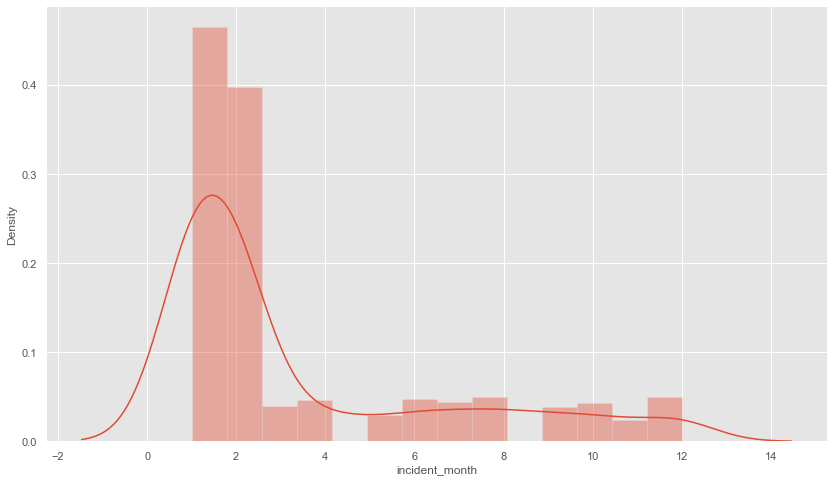

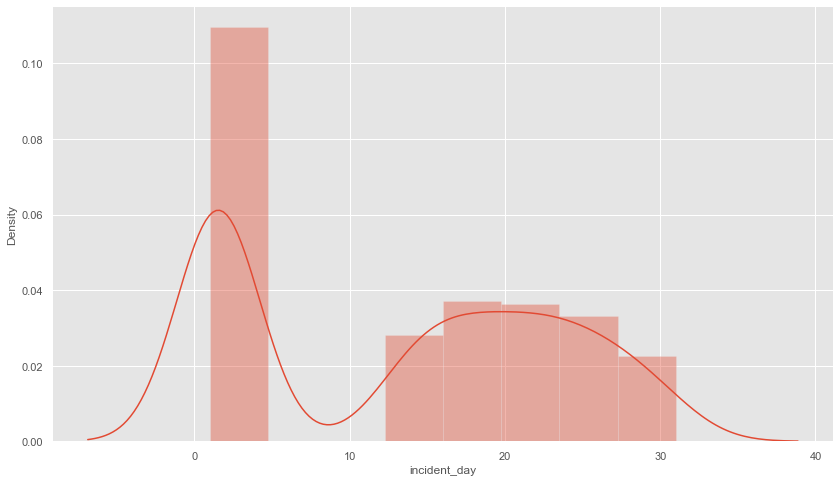

In [26]:
# Check Normality of continous data
for i in num.columns:
    plt.figure(figsize=(14,8))
    sns.distplot(df[i])
    plt.show()

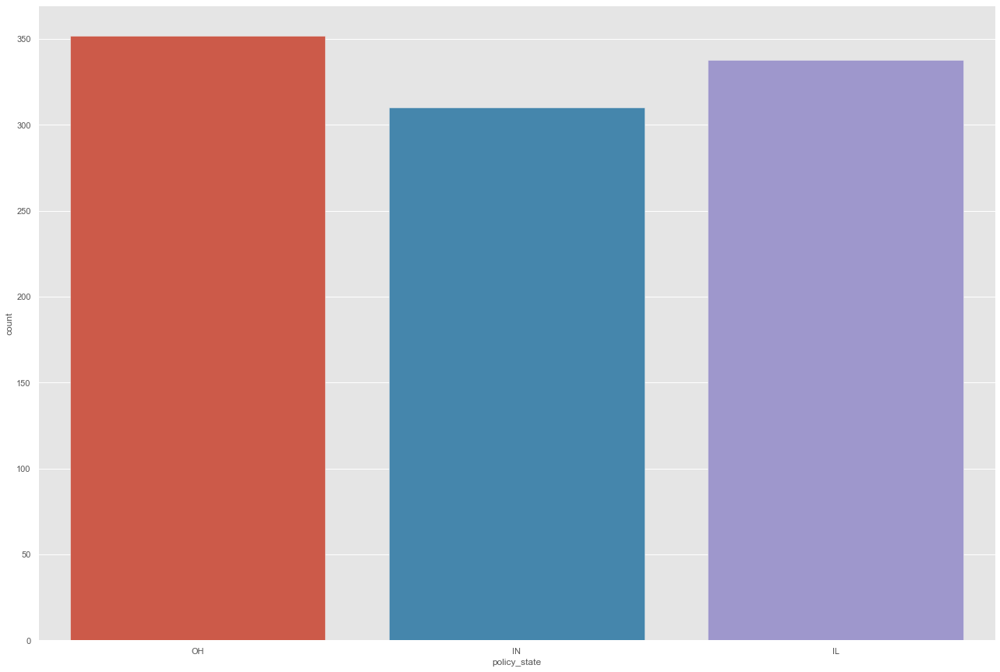

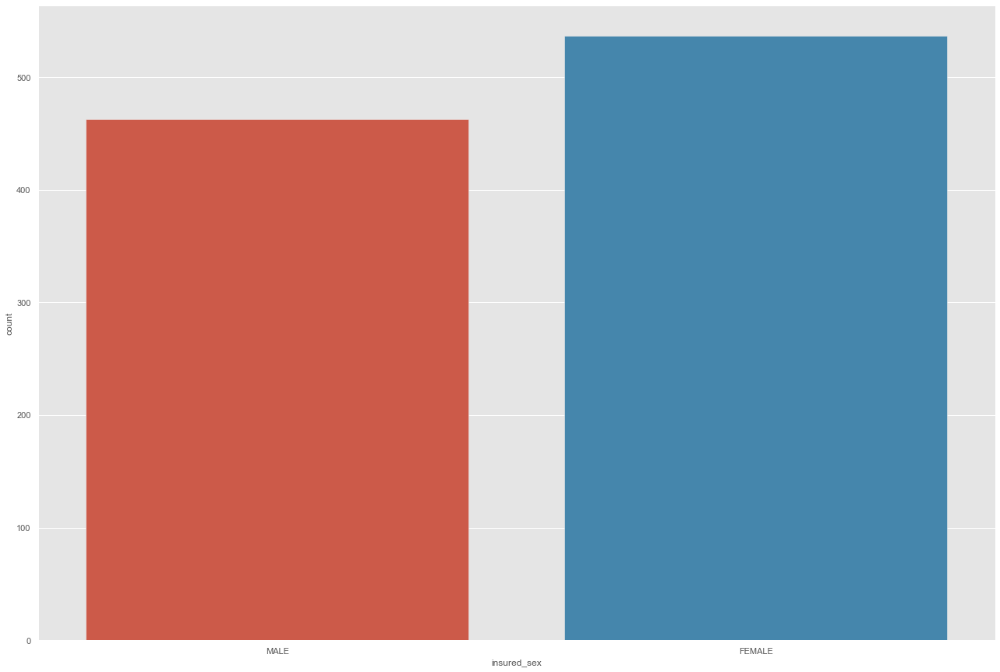

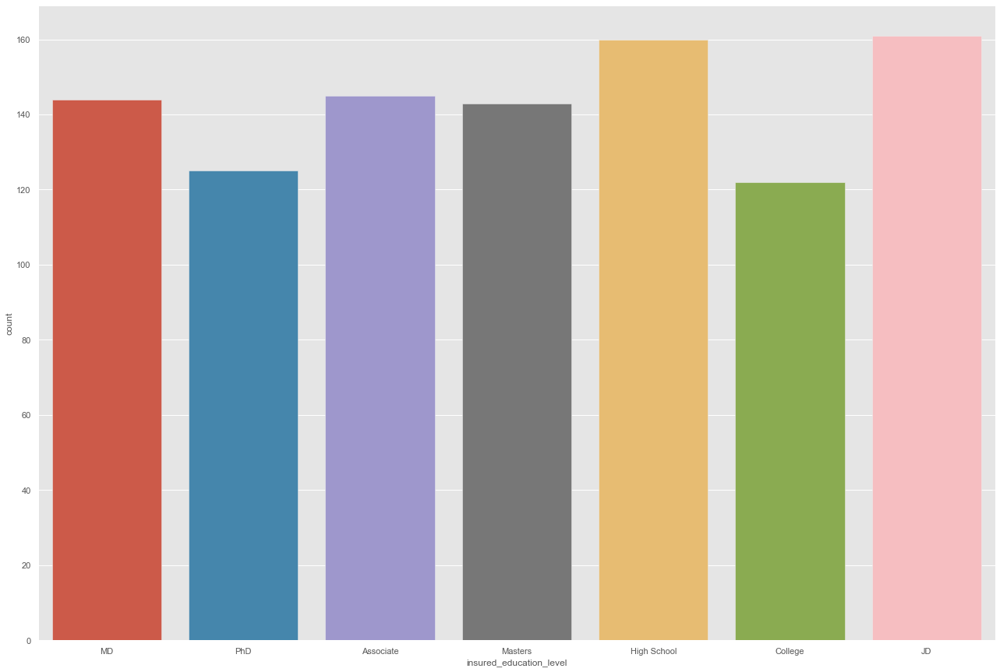

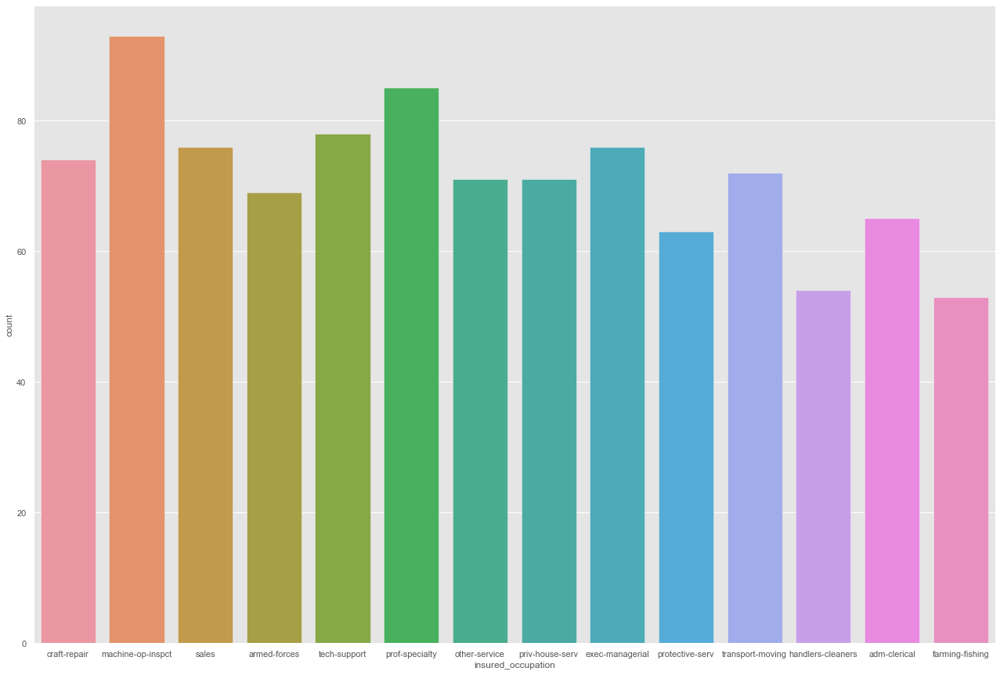

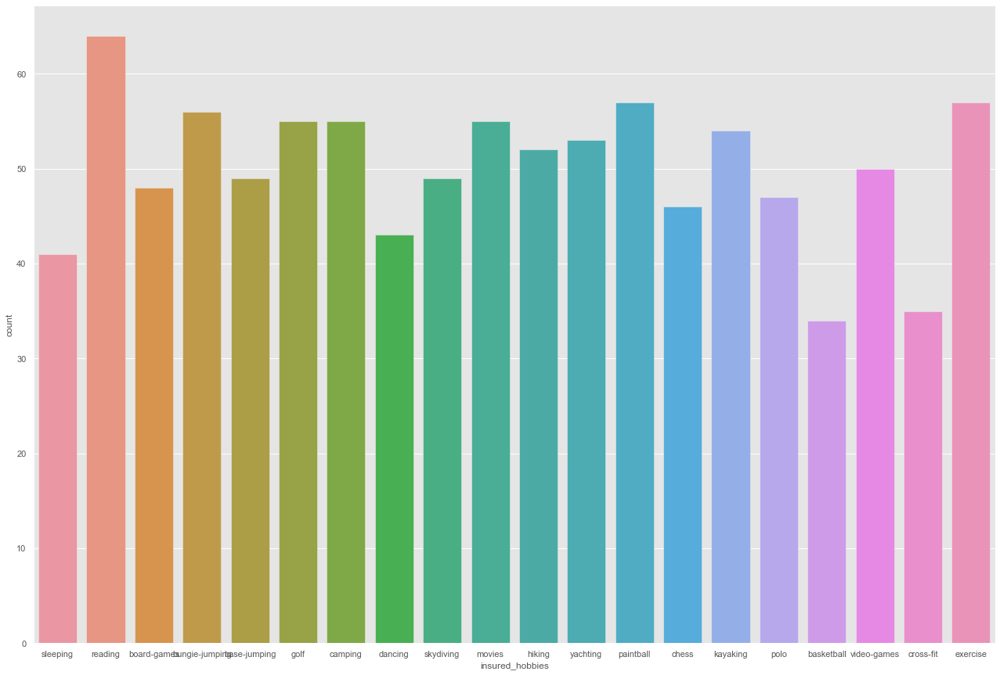

...

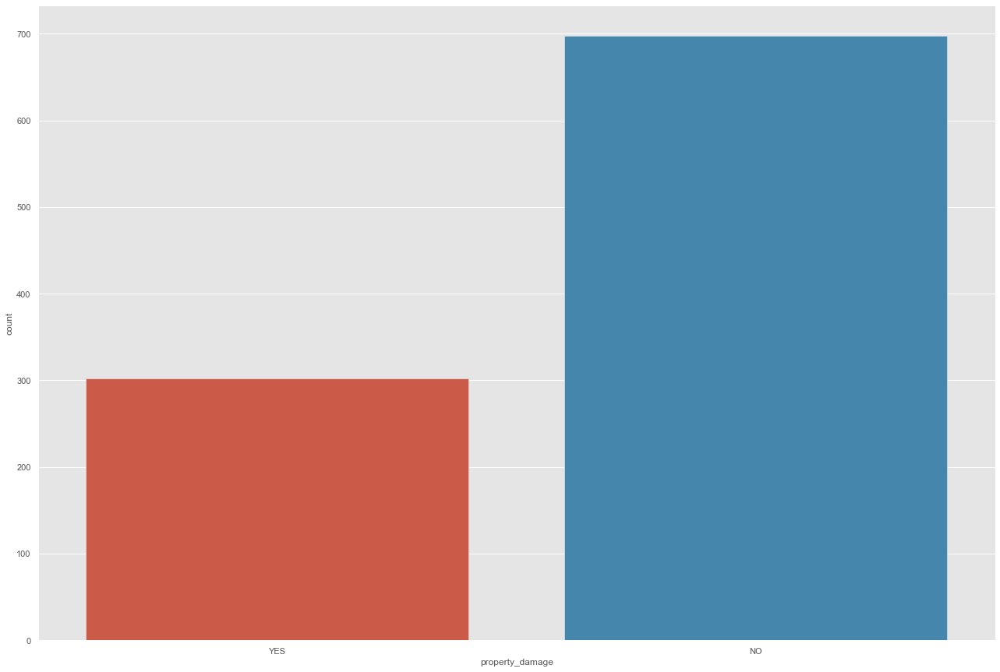

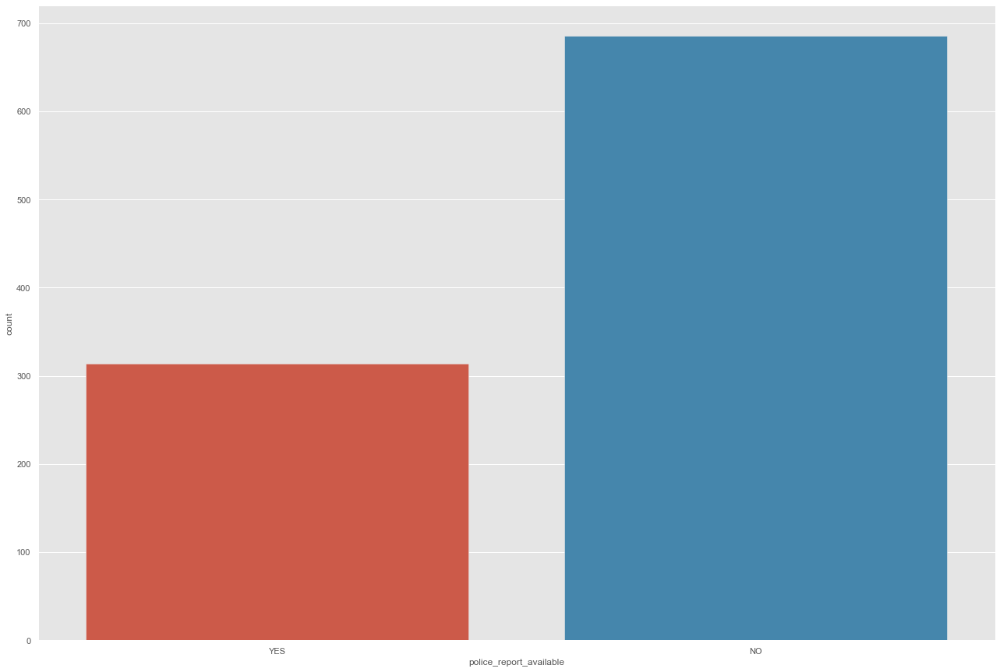

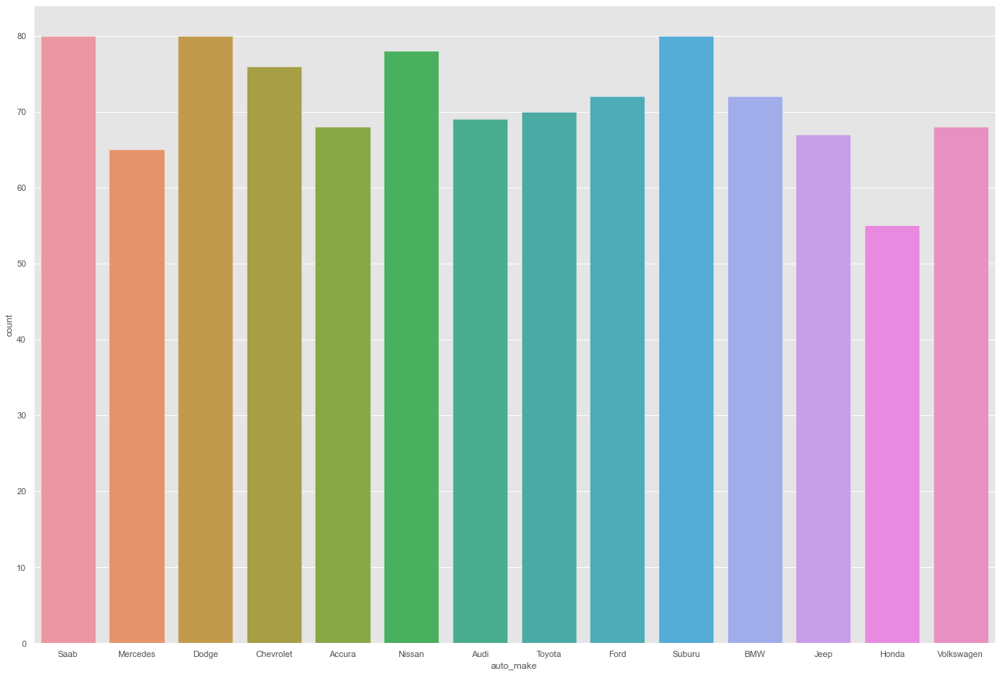

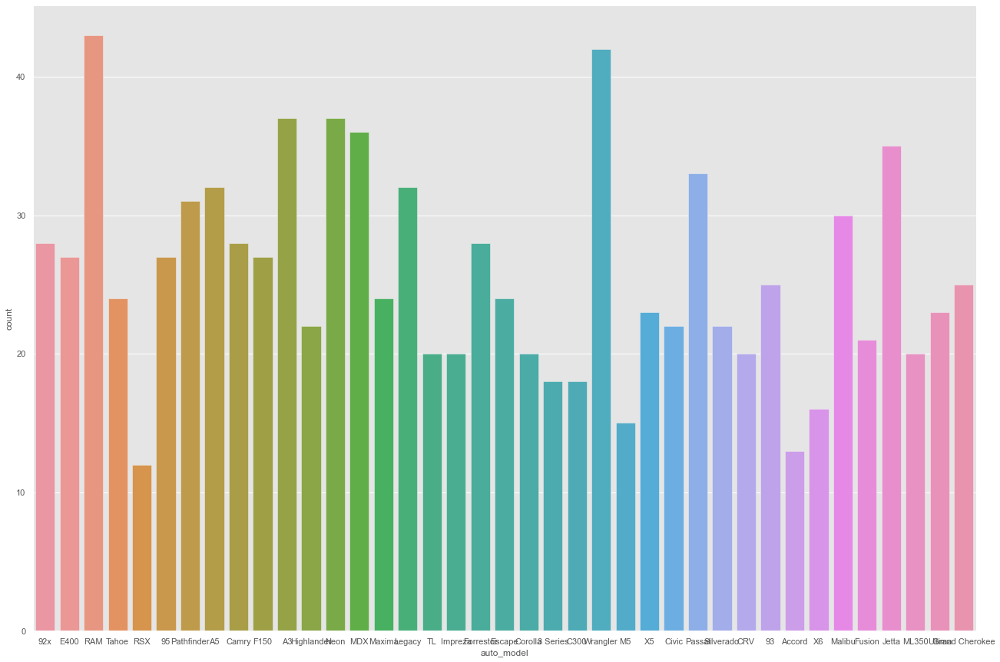

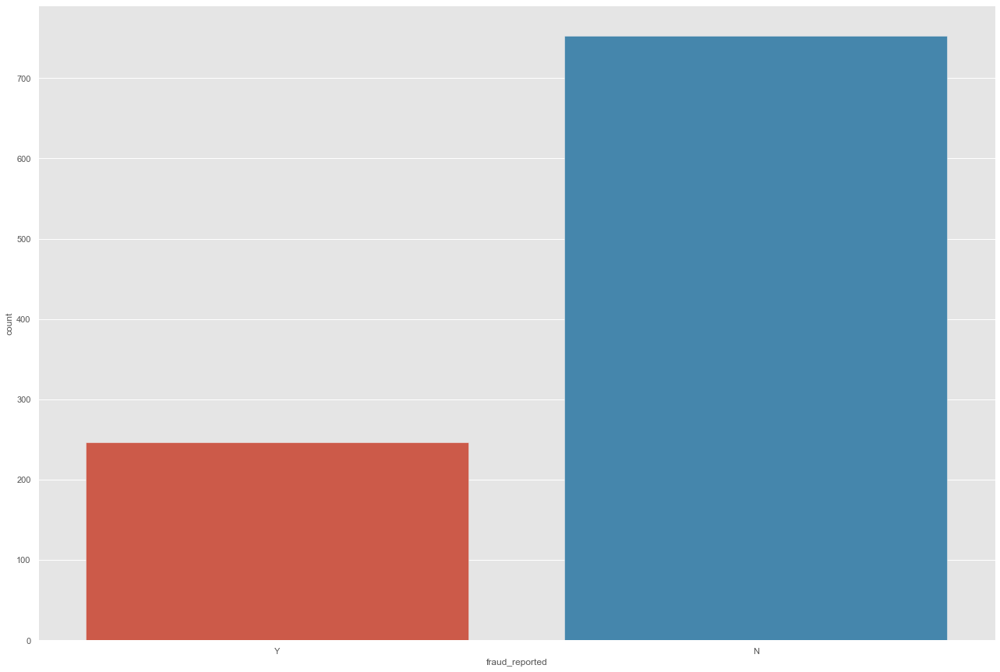

In [29]:
# Check count of categorical data
for i in cat.columns:
    plt.figure(figsize=(22,15))
    sns.countplot(df[i])
    plt.show()

OH count is more in policy_state.

Female is more.

Both High school and JD are the moredominant in insured_education_level.

Most of the insured are machine-op-inspect.

reading is the hobby of most of the insured followed by paintball and excercise.

most of the insured are own child.

Most of the incident happened is multiple vehicle collission followed by single vehicle collission and least is parked car.

Rear collission is the most in the dataset.

Most of the incident severity is Minor Damage and only a smaller amount of trivial damage occured.

Contacted authority is mostly Police and least with None contacted.

NY is the most incident happened state in the dataset and least amount of incidents in OH.

Springfield is the most incident happened city in the dataset and least amount of incidents in Northbrook.

Most of the data doesnt have any property damage.

In most cases, police report is not available.

Saab, Mercedes and Subaru is the most incident happened vehicles. least incident happened with honda.

RAM and C300 is the most accident marked vehicles. least is RSX.
Fraud reported is NO in most cases. genuine cases are more.

-------------------------------------------------------------------------------------------------------------------------------

### Bivariate analysis

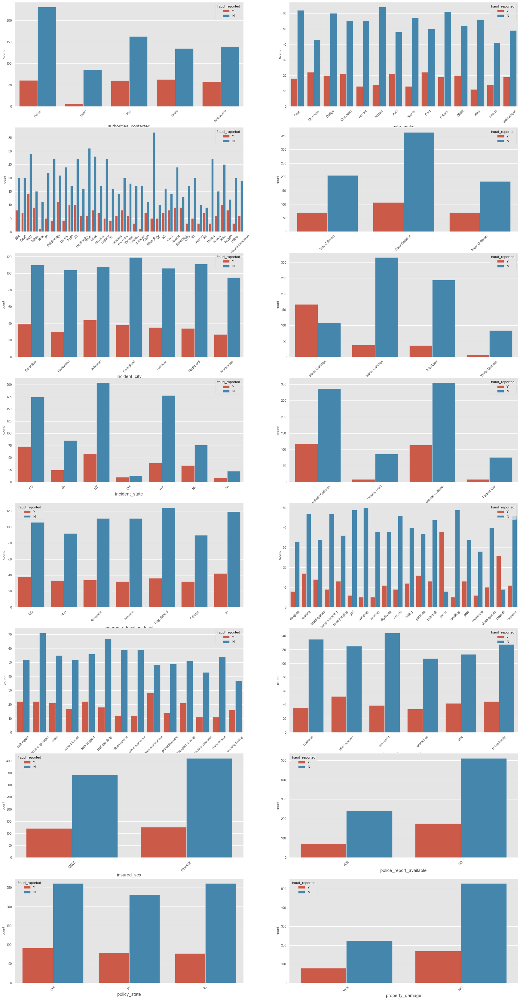

In [30]:
# Categorical variables Vs Target feature (Income)
plt.figure(figsize=(30,60), facecolor='white')
plotnumber = 1

for i in cat.columns.difference(['fraud_reported']):
    if plotnumber<=20 :
        ax = plt.subplot(8,2,plotnumber)
        sns.countplot(x=df[i],hue=df.fraud_reported)
        plt.xlabel(i,fontsize=15)
        plt.xticks(rotation=45)
       
    plotnumber+=1
plt.show()

Insured with occupation as adm-clerical, other service and pvt-house-service have more of acceptance of claim than reported as fraud.

Insured with occupation executive managerial are reported fraud more.

Insured with hobbies chess and crossfit have been reported as fraud more than others.

fraud reported is more for single vehicle collission. 


Major damage is reported as fraud than any other incident severity.

More number of fraud is reported in OH.

Mercedes is more fraud reported..

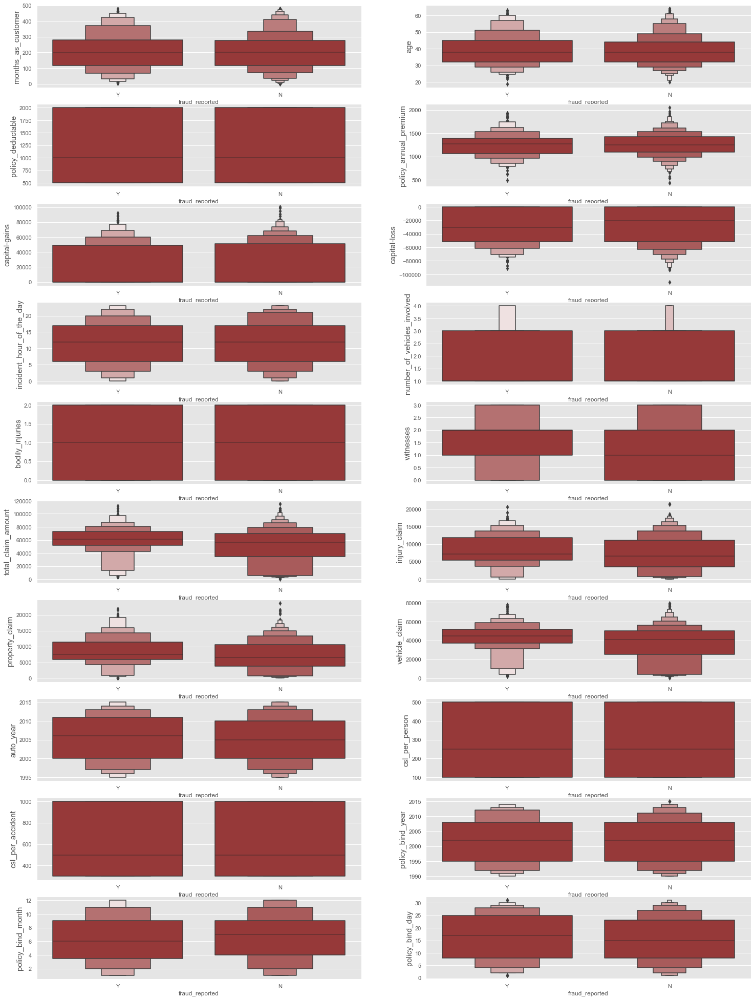

In [37]:
#lets check the numerical column and target relationship
# use boxenplot instead of warmplot for better insights
plt.figure(figsize=(25,35), facecolor='white')
plotnumber = 1

for i in num.columns:
    if plotnumber<=20:
        ax = plt.subplot(10,2,plotnumber)
        sns.boxenplot(x=df.fraud_reported,y=df[i],color='brown')
        plt.ylabel(i,fontsize=15)
       
    plotnumber+=1
plt.show()

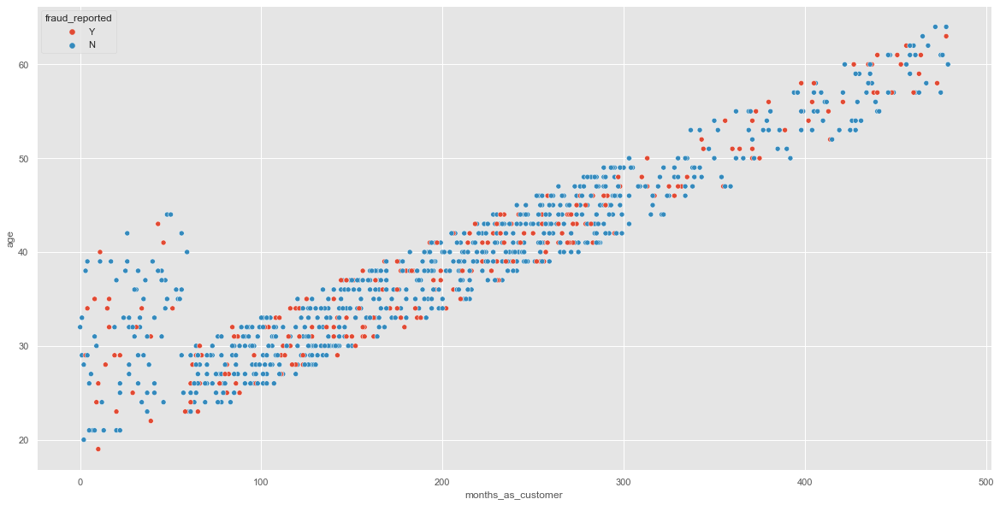

In [39]:
#lets check scatter plot of Total charges and tenure with churn

plt.figure(figsize=(20,10))
sns.scatterplot(df['months_as_customer'],df['age'],hue=df['fraud_reported'])
plt.show()

months as customer and age has direct relationship.

-------------------------------------------------------------------------------------------------------------------------------

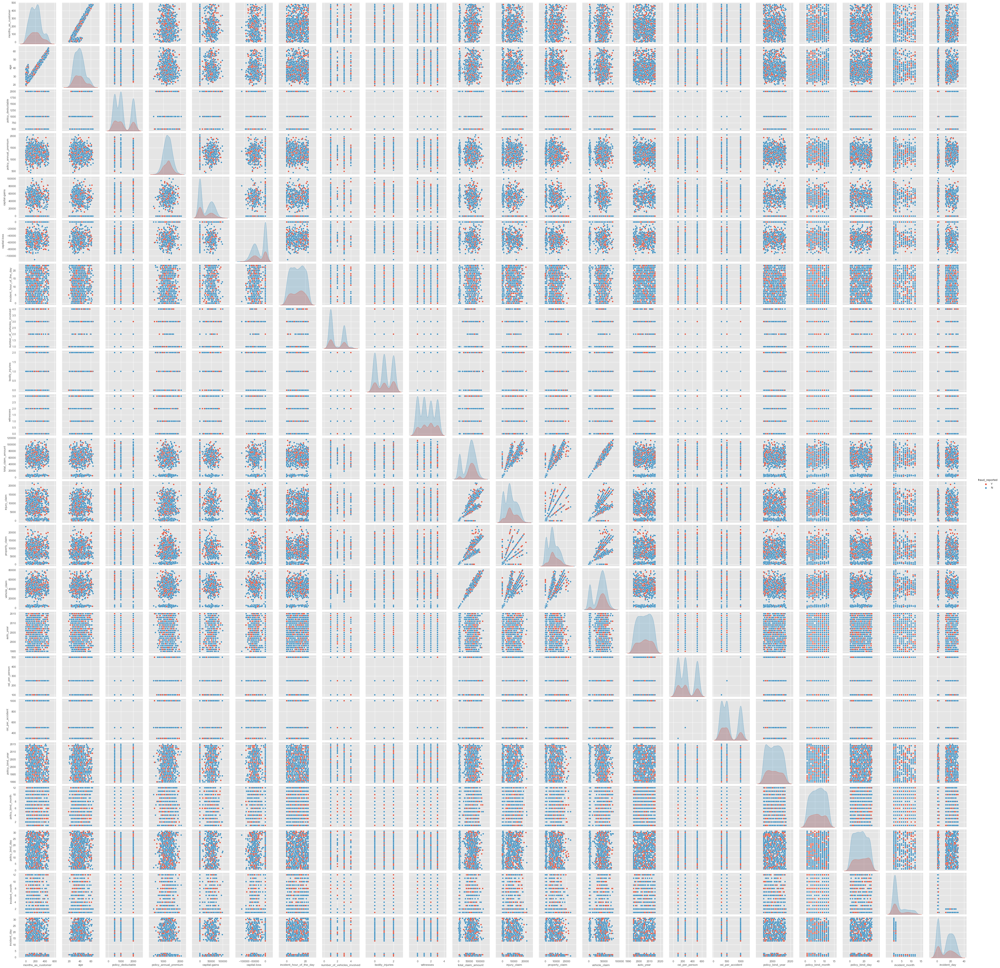

In [40]:
#pair ploting for df

sns.pairplot(df,hue="fraud_reported")
plt.show()

------------------------------------------------------------------------------------------------------------------------------

-------------------------------------------------------------------------------------------------------------------------------

### Outlier Treatment

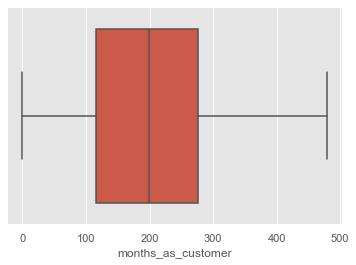

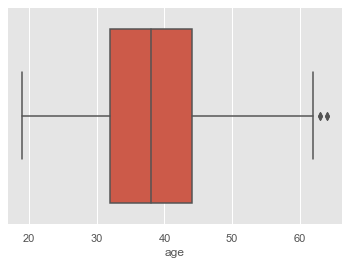

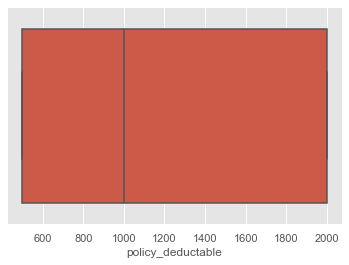

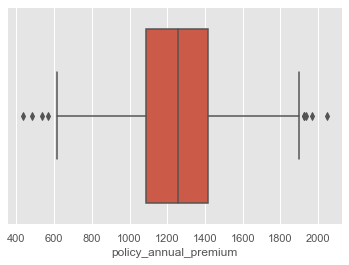

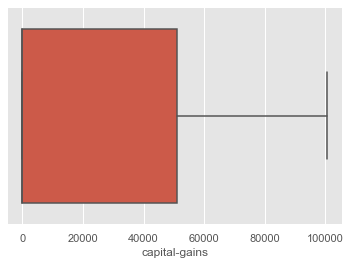

...

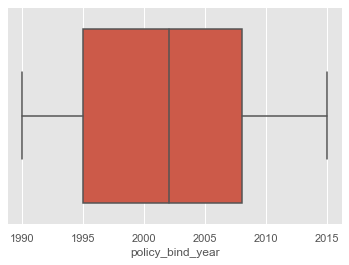

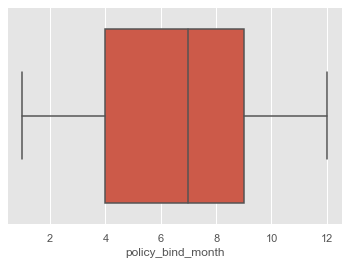

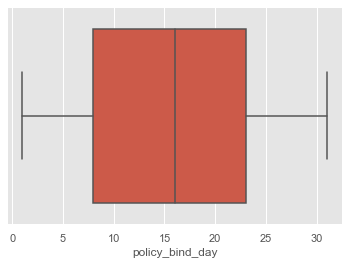

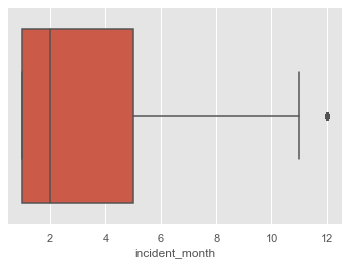

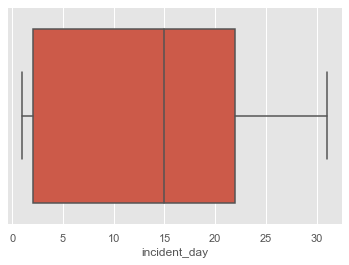

In [41]:
# Check outliers using boxplot
for col in num.columns:
    sns.boxplot(df[col])
    plt.show()

##### There are few  outliers.
##### [ age, policy_annual_premium, total_claim_amount, property_claim, incident_month ]  have outliers .

In [43]:
# remove outliers using Z-score method
outliers = df[['age','policy_annual_premium','total_claim_amount','property_claim','incident_month']]

z=np.abs(zscore(outliers))
df_new=df[(z<3).all(axis=1)]
df_new

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,csl_per_person,csl_per_accident,policy_bind_year,policy_bind_month,policy_bind_day,incident_month,incident_day
0,328,48,OH,1000,1406.91,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,250,500,2014,10,17,1,25
1,228,42,IN,2000,1197.22,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,2007,Y,250,500,2006,6,27,1,21
2,134,29,OH,2000,1413.14,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,100,300,2000,6,9,2,22
3,256,41,IL,2000,1415.74,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,250,500,1990,5,25,10,1
4,228,44,IL,1000,1583.91,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,500,1000,2014,6,6,2,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,1000,1310.80,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,20,1,YES,0,1,NO,87200,17440,8720,61040,Honda,Accord,2006,N,500,1000,1991,7,16,2,22
996,285,41,IL,1000,1436.79,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,23,1,YES,2,3,NO,108480,18080,18080,72320,Volkswagen,Passat,2015,N,100,300,2014,5,1,1,24
997,130,34,OH,500,1383.49,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,4,3,NO,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,250,500,2003,2,17,1,23
998,458,62,IL,2000,1356.92,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,2,1,NO,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,500,1000,2011,11,18,2,26


In [45]:
#checking the loss percentage

loss_percentage=(((df.shape[0]-df_new.shape[0])/df.shape[0])*100)
loss_percentage

0.4

It's acceptable

In [46]:
#checking the skewness

df_new.skew().sort_values()

vehicle_claim                 -0.619755
total_claim_amount            -0.593473
capital-loss                  -0.393015
auto_year                     -0.049276
incident_hour_of_the_day      -0.039123
policy_bind_month             -0.029722
bodily_injuries                0.011117
witnesses                      0.025758
policy_bind_day                0.028923
policy_annual_premium          0.032042
incident_day                   0.055659
policy_bind_year               0.058499
injury_claim                   0.267970
property_claim                 0.357130
months_as_customer             0.359605
csl_per_person                 0.413713
policy_deductable              0.473229
age                            0.474526
capital-gains                  0.478850
number_of_vehicles_involved    0.500364
csl_per_accident               0.609316
incident_month                 1.377097
dtype: float64

In [47]:
# I'll consider -0.5/0.5 is ok among features.

skew_cols=["vehicle_claim", "total_claim_amount", "csl_per_accident", "incident_month"]

In [48]:
#Removing the Skewness

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer()
df_new[skew_cols] = scaler.fit_transform(df_new[skew_cols].values)

In [49]:
#Checking the skewness again

df.skew()

months_as_customer             0.362177
age                            0.478988
policy_deductable              0.477887
policy_annual_premium          0.004402
capital-gains                  0.478850
capital-loss                  -0.391472
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
bodily_injuries                0.014777
witnesses                      0.019636
total_claim_amount            -0.594582
injury_claim                   0.264811
property_claim                 0.378169
vehicle_claim                 -0.621098
auto_year                     -0.048289
csl_per_person                 0.410015
csl_per_accident               0.605587
policy_bind_year               0.052511
policy_bind_month             -0.029321
policy_bind_day                0.024372
incident_month                 1.375894
incident_day                   0.059111
dtype: float64

-------------------------------------------------------------------------------------------------------------------------------

In [50]:
cat.columns

Index(['policy_state', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'property_damage', 'police_report_available', 'auto_make', 'auto_model',
       'fraud_reported'],
      dtype='object')

In [51]:
#Encoding the categorical columns:
# using label encoder for ordinal and nominal with get dummies


from sklearn.preprocessing import OrdinalEncoder
enc=OrdinalEncoder()

dummies_cat= ['policy_state','insured_sex','collision_type','property_damage','police_report_available','fraud_reported']
for i in cat.columns.difference(dummies_cat):
    df_new[i]=enc.fit_transform(df_new[i].values.reshape(-1,1))


df_final=pd.get_dummies(df_new,columns=dummies_cat, drop_first=True)

In [52]:
# View final dataset
df_final

,months_as_customer,age,policy_deductable,policy_annual_premium,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,csl_per_person,csl_per_accident,policy_bind_year,policy_bind_month,policy_bind_day,incident_month,incident_day,policy_state_IN,policy_state_OH,insured_sex_MALE,collision_type_Rear Collision,collision_type_Side Collision,property_damage_YES,police_report_available_YES,fraud_reported_Y
0,328,48,1000,1406.91,4.0,2.0,17.0,0.0,53300,0,2.0,0.0,4.0,4.0,1.0,5,1,1,2,0.717556,6510,13020,0.754553,10.0,1.0,2004,250,0.052612,2014,10,17,-1.101370,25,0,1,1,0,1,1,1,1
1,228,42,2000,1197.22,4.0,6.0,15.0,2.0,0,0,3.0,1.0,4.0,5.0,5.0,8,1,0,0,-1.777785,780,780,-1.787353,8.0,12.0,2007,250,0.052612,2006,6,27,-1.101370,21,1,0,1,1,0,0,0,1
2,134,29,2000,1413.14,6.0,11.0,2.0,3.0,35100,0,0.0,1.0,4.0,1.0,1.0,7,3,2,3,-0.716483,7700,3850,-0.820820,4.0,30.0,2007,100,-1.174021,2000,6,9,-0.026479,22,0,1,0,1,0,0,0,0
3,256,41,2000,1415.74,6.0,1.0,2.0,4.0,48900,-62400,2.0,0.0,4.0,2.0,0.0,5,1,1,2,0.392931,6340,6340,0.678427,3.0,34.0,2014,250,0.052612,1990,5,25,1.553647,1,0,0,0,0,0,0,0,1
4,228,44,1000,1583.91,0.0,11.0,2.0,4.0,66000,-46000,3.0,1.0,2.0,1.0,0.0,20,1,0,1,-1.730555,1300,650,-1.740710,0.0,31.0,2009,500,1.313327,2014,6,6,-0.026479,17,0,0,1,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,1000,1310.80,5.0,2.0,13.0,4.0,0,0,2.0,1.0,1.0,0.0,4.0,20,1,0,1,1.341314,17440,8720,1.260237,6.0,6.0,2006,500,1.313327,1991,7,16,-0.026479,22,0,1,0,0,0,1,0,0
996,285,41,1000,1436.79,6.0,9.0,17.0,5.0,70900,0,2.0,0.0,1.0,4.0,3.0,23,1,2,3,2.205819,18080,18080,1.906028,13.0,28.0,2015,100,-1.174021,2014,5,1,-1.101370,24,0,0,0,1,0,1,0,0
997,130,34,500,1383.49,5.0,1.0,3.0,2.0,35100,0,0.0,1.0,4.0,0.0,0.0,4,3,2,3,0.554684,7500,7500,0.778098,11.0,19.0,1996,250,0.052612,2003,2,17,-1.101370,23,0,1,0,0,1,0,1,0
998,458,62,2000,1356.92,0.0,5.0,0.0,5.0,0,0,2.0,0.0,3.0,1.0,0.0,2,1,0,1,-0.246683,5220,5220,-0.103792,1.0,5.0,1998,500,1.313327,2011,11,18,-0.026479,26,0,0,1,1,0,0,1,0


-------------------------------------------------------------------------------------------------------------------------------

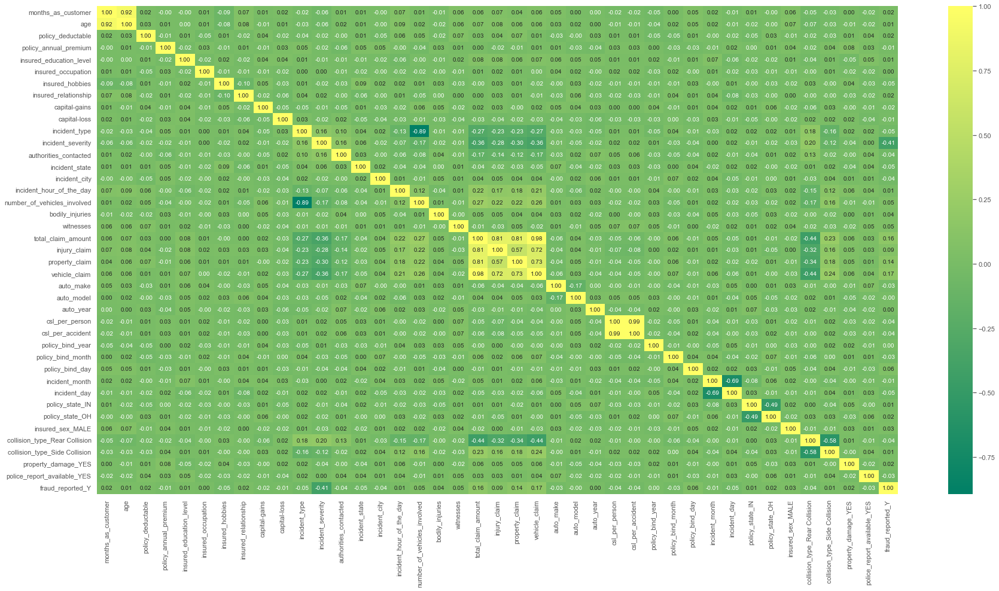

In [53]:
# heatmap correlation
plt.figure(figsize = (30,15))
sns.heatmap(df_final.corr(), annot=True,cmap='summer',fmt='.2f')
plt.show()

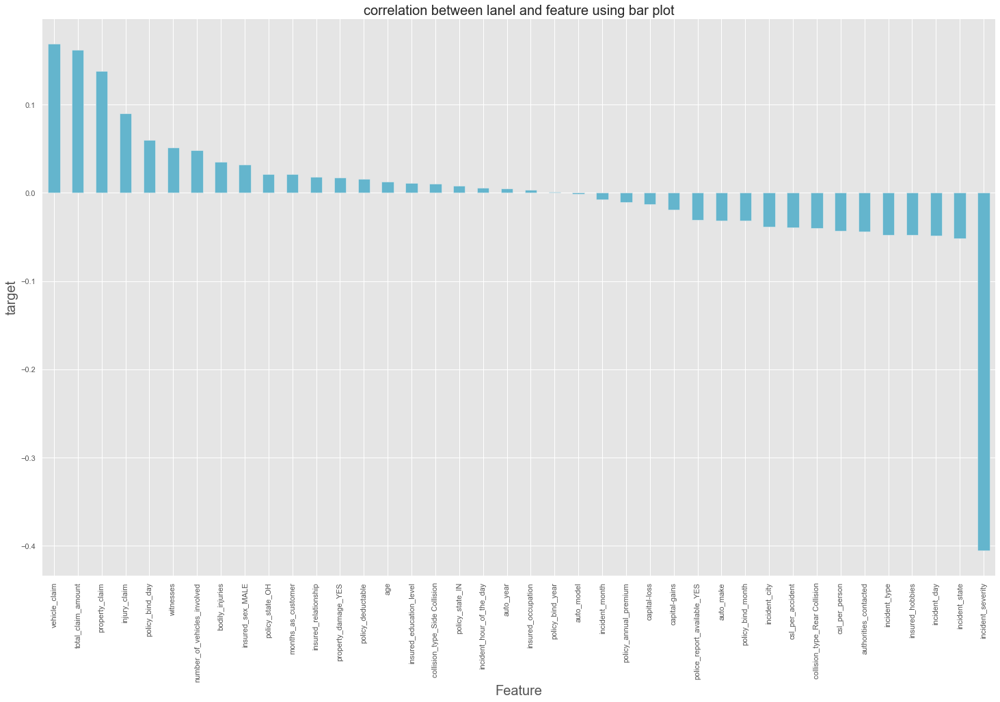

In [54]:
plt.figure(figsize = (25, 15))

df_final.corr()['fraud_reported_Y'].sort_values(ascending = False).drop(['fraud_reported_Y']).plot(kind = 'bar', color = 'c')

plt.xlabel('Feature', fontsize = 20)

plt.ylabel('target', fontsize = 20)

plt.title('correlation between lanel and feature using bar plot', fontsize = 20)

plt.show()

Multicollinearity is present in the dataset.

There is a strong correlation between number_of_vehicles_involved and incident_type.

Strong correlation between age and months_as_customer.

Multicollinearity between total claim amount, injury claim,property claim and vehicle claim.

policy_bind_year is least correlated with target variable.

Fraud_reported has strongly negative correlation with incident_severity.

-----------------------------------------------------------------------------------------------------------------------------

-------------------------------------------------------------------------------------------------------------------------------

In [58]:
# Data split
x = df_final.drop('fraud_reported_Y',axis=1)
y = df_final.fraud_reported_Y

#### SMOTE Technique for Imbalnced Data

In [59]:
from imblearn.over_sampling import SMOTE

smt = SMOTE()
x,y = smt.fit_resample(x,y)

1    750
0    750
Name: fraud_reported_Y, dtype: int64


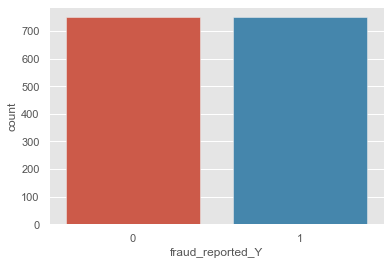

In [60]:
#Rechecking the count of Loan_Status

print(y.value_counts())
sns.countplot(y)
plt.show()

### Feature Reduction

##### Weight of evidence & information value

In [55]:
def calculate_woe_iv(dataset, feature, target):
    lst = []
    
    for i in range(dataset[feature].nunique()):
        val = list(dataset[feature].unique())[i]
        lst.append({
            'Value': val,
            'All': dataset[dataset[feature] == val].count()[feature],
            'Good': dataset[(dataset[feature] == val) & (dataset[target] == 0)].count()[feature],
            'Bad': dataset[(dataset[feature] == val) & (dataset[target] == 1)].count()[feature]
        })
        
    dset = pd.DataFrame(lst)
    dset['Distr_Good'] = dset['Good'] / dset['Good'].sum()
    dset['Distr_Bad'] = dset['Bad'] / dset['Bad'].sum()
    dset['WoE'] = np.log(dset['Distr_Good'] / dset['Distr_Bad'])
    dset = dset.replace({'WoE': {np.inf: 0, -np.inf: 0}})
    dset['IV'] = (dset['Distr_Good'] - dset['Distr_Bad']) * dset['WoE']
    iv = dset['IV'].sum()
    
    dset = dset.sort_values(by='WoE')
    
    return dset, iv

In [56]:
for col in df_final.columns:
    if col == 'fraud_reported_Y': continue
    else:
        print('WoE and IV for column: {}'.format(col))
        df, iv = calculate_woe_iv(df_final, col, 'fraud_reported_Y')
        print('IV score: {:.2f}'.format(iv))
        print('\n')

WoE and IV for column: months_as_customer
IV score: 0.52


WoE and IV for column: age
IV score: 0.22


WoE and IV for column: policy_deductable
IV score: 0.01


WoE and IV for column: policy_annual_premium
IV score: 0.01


WoE and IV for column: insured_education_level
IV score: 0.01


WoE and IV for column: insured_occupation
IV score: 0.10


WoE and IV for column: insured_hobbies
IV score: 0.82


WoE and IV for column: insured_relationship
IV score: 0.03


WoE and IV for column: capital-gains
IV score: 0.17


WoE and IV for column: capital-loss
IV score: 0.15


WoE and IV for column: incident_type
IV score: 0.21


WoE and IV for column: incident_severity
IV score: 1.35


WoE and IV for column: authorities_contacted
IV score: 0.19


WoE and IV for column: incident_state
IV score: 0.09


WoE and IV for column: incident_city
IV score: 0.01


WoE and IV for column: incident_hour_of_the_day
IV score: 0.18


WoE and IV for column: number_of_vehicles_involved
IV score: 0.02


WoE and IV for

In [57]:
l_iv=df_final.columns.difference(['policy_deductable','policy_annual_premium','insured_education_level','insured_relationship',
                            'incident_city','number_of_vehicles_involved','bodily_injuries','witnesses','csl_per_person',
                             'csl_per_accident','policy_state_IN','policy_state_OH','insured_sex_MALE',
                             'collision_type_Rear Collision','collision_type_Side Collision','property_damage_YES',
                            'police_report_available_YES','fraud_reported_Y'])

------------------------------------------------------------------------------------------------------------------------------

### Standarization

In [61]:
sc= StandardScaler()
x = pd.DataFrame(sc.fit_transform(x), columns = x.columns)
x

,months_as_customer,age,policy_deductable,policy_annual_premium,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,csl_per_person,csl_per_accident,policy_bind_year,policy_bind_month,policy_bind_day,incident_month,incident_day,policy_state_IN,policy_state_OH,insured_sex_MALE,collision_type_Rear Collision,collision_type_Side Collision,property_damage_YES,police_report_available_YES
0,1.128994,1.049345,-0.269855,0.674565,0.560056,-1.218733,1.392194,-1.543030,1.063889,0.963492,0.857009,-1.042061,1.273302,0.397913,-1.003127,-1.007970,-0.813305,0.127481,0.588777,0.698770,-0.229214,1.150281,0.733002,0.959750,-1.737002,-0.176662,-0.109670,0.093532,1.787636,1.122628,0.164943,-1.134266,1.236382,-0.546536,1.603567,1.279142,-0.789542,1.901416,1.805925,1.812654
1,0.218402,0.363100,1.453065,-0.260628,0.560056,-0.166225,1.018169,-0.276898,-0.873582,0.963492,1.849241,0.039472,1.273302,0.891398,1.065381,-0.540692,-0.813305,-1.147327,-1.331147,-2.011390,-1.459064,-1.500372,-2.026136,0.429015,-0.687583,0.348771,-0.109670,0.093532,0.642022,-0.121511,1.352156,-1.134266,0.829052,1.829707,-0.623610,1.279142,1.266557,-0.525924,-0.553733,-0.551677
2,-0.637554,-1.123764,1.453065,0.702350,1.642127,1.149410,-1.412988,0.356168,0.402314,0.963492,-1.127456,0.039472,1.273302,-1.082542,-1.003127,-0.696452,1.301006,1.402289,1.548739,-0.858723,0.026199,-0.835543,-0.977003,-0.632454,1.029649,0.348771,-1.099434,-1.211884,-0.217189,-0.121511,-0.784827,-0.001699,0.930885,-0.546536,1.603567,-0.781774,1.266557,-0.525924,-0.553733,-0.551677
3,0.473368,0.248726,1.453065,0.713946,1.642127,-1.481860,-1.412988,0.989234,0.903948,-1.281324,0.857009,-1.042061,1.273302,-0.589057,-1.520254,-1.007970,-0.813305,0.127481,0.588777,0.346199,-0.265702,-0.296317,0.650371,-0.897821,1.411256,1.574781,-0.109670,0.093532,-1.649208,-0.432546,1.114714,1.663211,-1.207598,-0.546536,-0.623610,-0.781774,-0.789542,-0.525924,-0.553733,-0.551677
4,0.218402,0.591848,-0.269855,1.463964,-1.604086,1.149410,-1.412988,0.989234,1.525538,-0.691340,1.849241,0.039472,-0.098511,-1.082542,-1.520254,1.328419,-0.813305,-1.147327,-0.371185,-1.960094,-1.347454,-1.528524,-1.975507,-1.693923,1.125050,0.699059,1.539936,1.435219,1.787636,-0.121511,-1.140991,-0.001699,0.421722,-0.546536,-0.623610,1.279142,1.266557,-0.525924,-0.553733,-0.551677
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,1.047041,1.163719,-0.443870,-0.972315,-0.950371,0.411204,-0.811715,-0.527508,-0.873582,0.963492,0.857009,-1.042061,0.311143,-0.784411,-1.103703,-1.163729,-0.813305,-1.147327,0.588777,-0.110739,1.224068,-0.605776,-0.321077,0.956094,-0.571655,0.173626,1.539936,1.435219,0.355618,-1.365649,0.758550,-0.229773,0.421722,-0.546536,-0.623610,-0.781774,-0.789542,-0.525924,-0.553733,-0.551677
1496,0.227508,0.248726,-0.583427,0.938997,-0.669389,0.431219,-0.035524,-0.219029,-0.728145,0.963492,-1.127456,-0.353994,-0.472184,0.083959,0.924519,-0.696452,1.301006,-1.147327,0.588777,0.022685,1.034547,-0.326851,-0.159797,-0.053205,0.057839,0.173626,-0.472584,-0.381383,-0.933199,0.811593,-0.903548,0.330086,-1.207598,-0.546536,-0.623610,-0.781774,-0.789542,-0.525924,-0.553733,-0.551677
1497,0.946876,0.934970,-0.721260,-0.497761,0.276611,0.197031,-1.341824,1.019486,2.125136,-0.960466,-0.087807,-1.042061,0.587395,-0.612639,-1.027839,0.238104,-0.813305,0.127481,-0.371185,-0.177805,-0.601603,-0.064168,-0.063351,0.403653,-1.487100,0.874204,-0.630946,-0.590367,-0.073988,-0.432546,1.233435,0.678502,0.014392,-0.546536,1.603567,-0.781774,-0.789542,-0.525924,-0.553733,-0.551677
1498,-0.191364,-0.208771,-0.600656,-0.248118,-0.935583,-0.3907

### RFE

In [62]:
rfe = RFE(RandomForestClassifier(), n_features_to_select=20).fit(x,y)

In [63]:
l2_rfe = x.columns[rfe.get_support()]

In [64]:
l2_rfe

Index(['months_as_customer', 'policy_annual_premium', 'insured_occupation',
       'insured_hobbies', 'insured_relationship', 'incident_type',
       'incident_severity', 'authorities_contacted', 'incident_state',
       'incident_hour_of_the_day', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_make', 'auto_model',
       'csl_per_person', 'csl_per_accident', 'policy_bind_month',
       'policy_bind_day'],
      dtype='object')

### SKB

In [65]:
SKB = SelectKBest(f_classif, k=20).fit(x, y )

In [66]:
l3_skb = x.columns[SKB.get_support()]

In [67]:
l3_skb

Index(['insured_hobbies', 'incident_type', 'incident_severity',
       'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_make', 'csl_per_person',
       'csl_per_accident', 'policy_bind_month', 'policy_state_IN',
       'policy_state_OH', 'insured_sex_MALE', 'collision_type_Rear Collision',
       'collision_type_Side Collision', 'property_damage_YES',
       'police_report_available_YES'],
      dtype='object')

In [68]:
list(set(list(l_iv)+list(l2_rfe)+list(l3_skb)))

['insured_relationship',
 'property_claim',
 'incident_severity',
 'csl_per_person',
 'incident_hour_of_the_day',
 'incident_state',
 'policy_bind_month',
 'vehicle_claim',
 'authorities_contacted',
 'witnesses',
 'csl_per_accident',
 'policy_annual_premium',
 'capital-gains',
 'insured_sex_MALE',
 'property_damage_YES',
 'collision_type_Side Collision',
 'insured_hobbies',
 'incident_day',
 'policy_state_IN',
 'collision_type_Rear Collision',
 'auto_make',
 'age',
 'police_report_available_YES',
 'incident_type',
 'injury_claim',
 'incident_month',
 'months_as_customer',
 'auto_year',
 'insured_occupation',
 'policy_bind_day',
 'bodily_injuries',
 'capital-loss',
 'policy_state_OH',
 'auto_model',
 'total_claim_amount',
 'policy_bind_year']

In [77]:
final_list= ['insured_relationship',
 'property_claim',
 'incident_severity',
 'csl_per_person',
 'incident_hour_of_the_day',
 'incident_state',
 'policy_bind_month',
 'vehicle_claim',
 'authorities_contacted',
 'witnesses',
 #'csl_per_accident',
 'policy_annual_premium',
 'capital-gains',
 'insured_sex_MALE',
 'property_damage_YES',
 'collision_type_Side Collision',
 'insured_hobbies',
 'incident_day',
 'policy_state_IN',
 'collision_type_Rear Collision',
 'auto_make',
 'age',
 'police_report_available_YES',
 'incident_type',
 'injury_claim',
 'incident_month',
 'months_as_customer',
 'auto_year',
 'insured_occupation',
 'policy_bind_day',
 'bodily_injuries',
 'capital-loss',
 'policy_state_OH',
 'auto_model',
 #'total_claim_amount',
 'policy_bind_year']

### VIF check Multicollinarity

In [78]:
x = x[final_list]
y = y

In [79]:
vif = pd.DataFrame()
vif["VIF_Factor"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif["features"] = x.columns

In [80]:
vif.sort_values(by='VIF_Factor', ascending=False, inplace=True)
vif

,VIF_Factor,features
25,7.095682,months_as_customer
20,7.055972,age
7,3.257105,vehicle_claim
1,2.151016,property_claim
24,1.952291,incident_month
16,1.941676,incident_day
23,1.934252,injury_claim
18,1.567580,collision_type_Rear Collision
14,1.312378,collision_type_Side Collision
2,1.257181,incident_severity


-------------------------------------------------------------------------------------------------------------------------------

## ML Alogs

In [82]:
# get best random state

Accu=0
RS=0
for i in range(1,100):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2, random_state =i)
    lr=LogisticRegression()
    lr.fit(x_train, y_train)
    pred = lr.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>Accu:
        Accu=acc
        RS=i
print("Best accuracy is ",Accu," on Random_state ",RS)

Best accuracy is  0.8166666666666667  on Random_state  95


#### Split the data

In [83]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=95)

### Logistic Regression

In [84]:
lr.fit(x_train,y_train)
pred_train=lr.predict(x_train)
pred_test=lr.predict(x_test)
score_test=roc_auc_score(y_test,pred_test)
score_train=roc_auc_score(y_train,pred_train)
score_acc=accuracy_score(y_test,pred_test)
print('Roc_Auc train: ',score_train)
print('Roc_Auc test: ',score_test)
print('Accuracy test: ',score_acc)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,pred_test))
print('Classification Report: ','\n',classification_report(y_test,pred_test))

Roc_Auc train:  0.7691060727710162
Roc_Auc test:  0.8164224310721127
Accuracy test:  0.8166666666666667
Confusion Matrix:  
 [[116  27]
 [ 28 129]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.81      0.81      0.81       143
           1       0.83      0.82      0.82       157

    accuracy                           0.82       300
   macro avg       0.82      0.82      0.82       300
weighted avg       0.82      0.82      0.82       300



### cross-validation

In [85]:
for i in range(3,11):
    cvs=cross_val_score(lr,x,y,cv=i)
    cvs_mean=cvs.mean()
    cvs_std=cvs.std()
    print ("At cv: ",i)
    print ("Cross validation score is : ",cvs_mean*100)
    print ("Cross validation score_std is : ", cvs_std*100)
    print ("accuracy Score is : ",score_acc*100)
    print ("\n")

At cv:  3
Cross validation score is :  72.46666666666667
Cross validation score_std is :  11.956959851437523
accuracy Score is :  81.66666666666667


At cv:  4
Cross validation score is :  75.20000000000002
Cross validation score_std is :  9.87387124350593
accuracy Score is :  81.66666666666667


At cv:  5
Cross validation score is :  75.53333333333335
Cross validation score_std is :  8.691247193457203
accuracy Score is :  81.66666666666667


At cv:  6
Cross validation score is :  75.33333333333334
Cross validation score_std is :  10.092021050755339
accuracy Score is :  81.66666666666667


At cv:  7
Cross validation score is :  75.62020678734436
Cross validation score_std is :  9.785865802584027
accuracy Score is :  81.66666666666667


At cv:  8
Cross validation score is :  75.88498407099785
Cross validation score_std is :  9.19587762368432
accuracy Score is :  81.66666666666667


At cv:  9
Cross validation score is :  75.55250943895342
Cross validation score_std is :  10.0595014626408

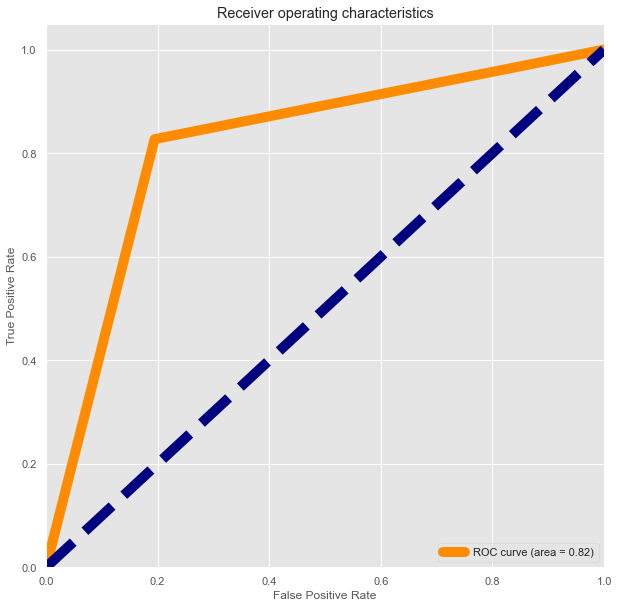

In [86]:
# ROC curve 
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### Decision Tree

In [87]:
#Finding the best random state:

Accu=0
RS=0
for i in range(1,100):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2, random_state =i)
    dtc=DecisionTreeClassifier()
    dtc.fit(x_train,y_train)
    pred = dtc.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>Accu:
        Accu=acc
        RS=i
print("Best accuracy is ",Accu," on Random_state ",RS)

Best accuracy is  0.8866666666666667  on Random_state  43


In [88]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2, random_state = RS)

dtc.fit(x_train,y_train)
pred_train=dtc.predict(x_train)
pred_test=dtc.predict(x_test)
score_train=roc_auc_score(y_train,pred_train)
score_test=roc_auc_score(y_test,pred_test)
print('Roc_Auc Score_train: ',score_train)
print('Roc_Auc Score_test: ',score_test)
print('Confusion Matrix: ' ,'\n','\n',confusion_matrix(y_test,pred_test))
print('Classification Report: ','\n',classification_report(y_test,pred_test))
print('CV  : ',cross_val_score(dtc,x,y,cv=10).mean())

Roc_Auc Score_train:  1.0
Roc_Auc Score_test:  0.8997509339975094
Confusion Matrix:  
 
 [[140  14]
 [ 16 130]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.90      0.91      0.90       154
           1       0.90      0.89      0.90       146

    accuracy                           0.90       300
   macro avg       0.90      0.90      0.90       300
weighted avg       0.90      0.90      0.90       300

CV  :  0.8346666666666668


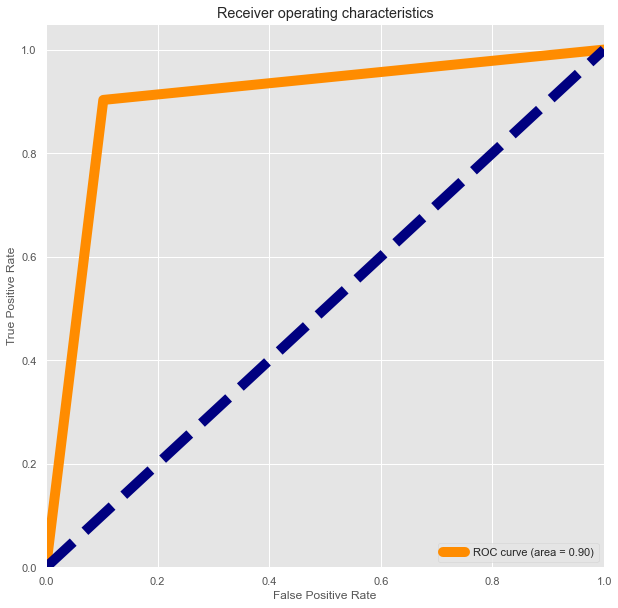

In [89]:
# ROC curve
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### SVM

In [90]:
#Finding the best random state:

Accu=0
RS=0
for i in range(1,100):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2, random_state =i)
    svc=SVC()
    svc.fit(x_train, y_train)
    pred = svc.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>Accu:
        Accu=acc
        RS=i
print("Best accuracy is ",Accu," on Random_state ",RS)

Best accuracy is  0.89  on Random_state  28


In [91]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2, random_state = RS)

svc.fit(x_train,y_train)
pred_train=svc.predict(x_train)
pred_test=svc.predict(x_test)
score_test=roc_auc_score(y_test,pred_test)
score_train=roc_auc_score(y_train,pred_train)
print('Roc_Auc train: ',score_train)
print('Roc_Auc test: ',score_test)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,pred_test))
print('Classification Report: ','\n',classification_report(y_test,pred_test))
print('CV  : ',cross_val_score(svc,x,y,cv=10).mean())

Roc_Auc train:  0.9506562955760817
Roc_Auc test:  0.8902113459399332
Confusion Matrix:  
 [[130  15]
 [ 18 137]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.88      0.90      0.89       145
           1       0.90      0.88      0.89       155

    accuracy                           0.89       300
   macro avg       0.89      0.89      0.89       300
weighted avg       0.89      0.89      0.89       300

CV  :  0.8400000000000001


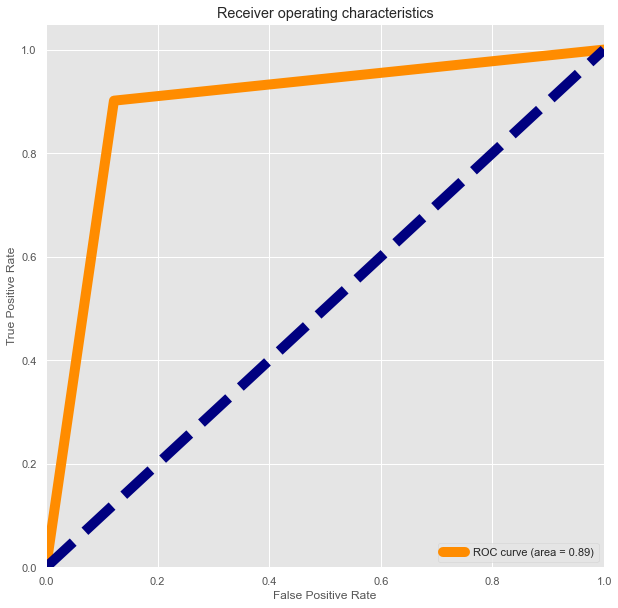

In [92]:
# ROC curve
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

------------------------------------------------------------------------------------------------------------------------------

### KNN

In [93]:
#Finding the best random state:

Accu=0
RS=0
for i in range(1,100):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2, random_state =i)
    knn=KNeighborsClassifier()
    knn.fit(x_train, y_train)
    pred = knn.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>Accu:
        Accu=acc
        RS=i
print("Best accuracy is ",Accu," on Random_state ",RS)

Best accuracy is  0.74  on Random_state  37


In [94]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2, random_state = RS)

knn.fit(x_train,y_train)
pred_train=knn.predict(x_train)
pred_test=knn.predict(x_test)
score_test=roc_auc_score(y_test,pred_test)
score_train=roc_auc_score(y_train,pred_train)
print('Roc_Auc train: ',score_train)
print('Roc_Auc test: ',score_test)
print('Auccuracy test: ',score_acc)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,pred_test))
print('Classification Report: ','\n',classification_report(y_test,pred_test))
print('CV  : ',cross_val_score(knn,x,y,cv=10).mean())

Roc_Auc train:  0.7494339884714216
Roc_Auc test:  0.7317018909899888
Auccuracy test:  0.8166666666666667
Confusion Matrix:  
 [[ 70  75]
 [  3 152]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.96      0.48      0.64       145
           1       0.67      0.98      0.80       155

    accuracy                           0.74       300
   macro avg       0.81      0.73      0.72       300
weighted avg       0.81      0.74      0.72       300

CV  :  0.6813333333333333


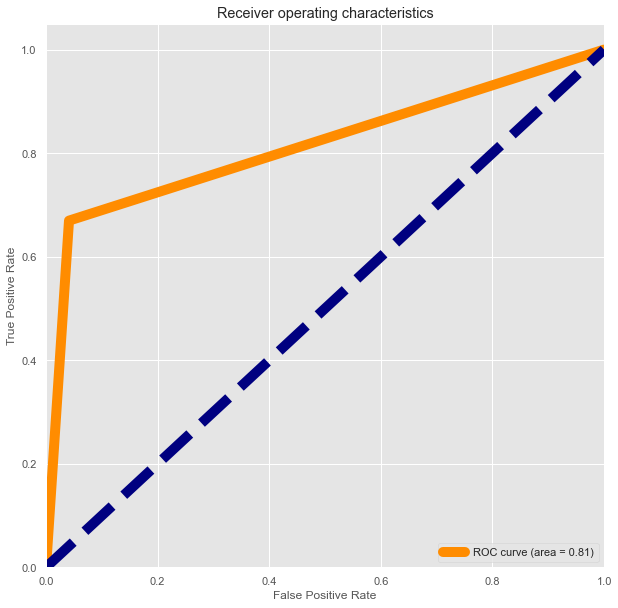

In [95]:
# ROC curve
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### Ensembles Techniques

### Random Forest Classifier

In [96]:
#Finding the best random state

Accu=0
RS=0
for i in range(1,100):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2, random_state =i)
    rfc=RandomForestClassifier()
    rfc.fit(x_train, y_train)
    pred = rfc.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>Accu:
        Accu=acc
        RS=i
print("Best accuracy is ",Accu," on Random_state ",RS)

Best accuracy is  0.9166666666666666  on Random_state  17


In [97]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2, random_state = RS)

rfc.fit(x_train,y_train)
pred_train=rfc.predict(x_train)
pred_test=rfc.predict(x_test)
score_test=roc_auc_score(y_test,pred_test)
score_train=roc_auc_score(y_train,pred_train)
score_acc=accuracy_score(y_test,pred_test)
print('Auc test: ',score_acc)
print('Roc_Auc train: ',score_train)
print('Roc_Auc test: ',score_test)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,pred_test))
print('Classification Report: ','\n',classification_report(y_test,pred_test))
print('CV  : ',cross_val_score(rfc,x,y,cv=10).mean())

Auc test:  0.91
Roc_Auc train:  1.0
Roc_Auc test:  0.9096305188742163
Confusion Matrix:  
 [[142  11]
 [ 16 131]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.90      0.93      0.91       153
           1       0.92      0.89      0.91       147

    accuracy                           0.91       300
   macro avg       0.91      0.91      0.91       300
weighted avg       0.91      0.91      0.91       300

CV  :  0.8726666666666667


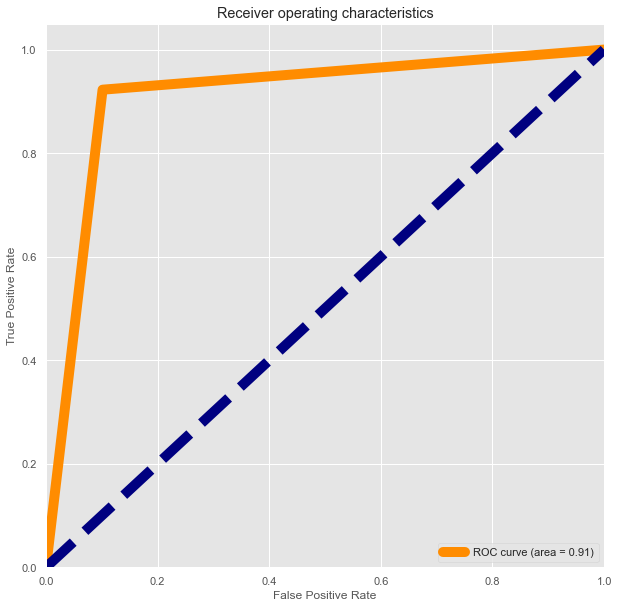

In [98]:
# ROC curve
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### GBC

In [99]:
#Finding the best random state

Accu=0
RS=0
for i in range(1,100):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2, random_state =i)
    gbc=GradientBoostingClassifier()
    gbc.fit(x_train, y_train)
    pred = gbc.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>Accu:
        Accu=acc
        RS=i
print("Best accuracy is ",Accu," on Random_state ",RS)

Best accuracy is  0.9266666666666666  on Random_state  17


In [100]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2, random_state = RS)


gbc.fit(x_train,y_train)
pred_test=gbc.predict(x_test)
pred_train=gbc.predict(x_train)
score_test=roc_auc_score(y_test,pred_test)
score_train=roc_auc_score(y_train,pred_train)
score_acc=accuracy_score(y_test,pred_test)
print('Accuracy test: ',score_acc)
print('Roc_Auc train: ',score_train)
print('Roc_Auc test: ',score_test)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,pred_test))
print('Classification Report: ','\n',classification_report(y_test,pred_test))
print('CV  : ',cross_val_score(gbc,x,y,cv=10).mean())

Accuracy test:  0.9266666666666666
Roc_Auc train:  0.95995733226664
Roc_Auc test:  0.9270374816593303
Confusion Matrix:  
 [[139  14]
 [  8 139]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.95      0.91      0.93       153
           1       0.91      0.95      0.93       147

    accuracy                           0.93       300
   macro avg       0.93      0.93      0.93       300
weighted avg       0.93      0.93      0.93       300

CV  :  0.8773333333333333


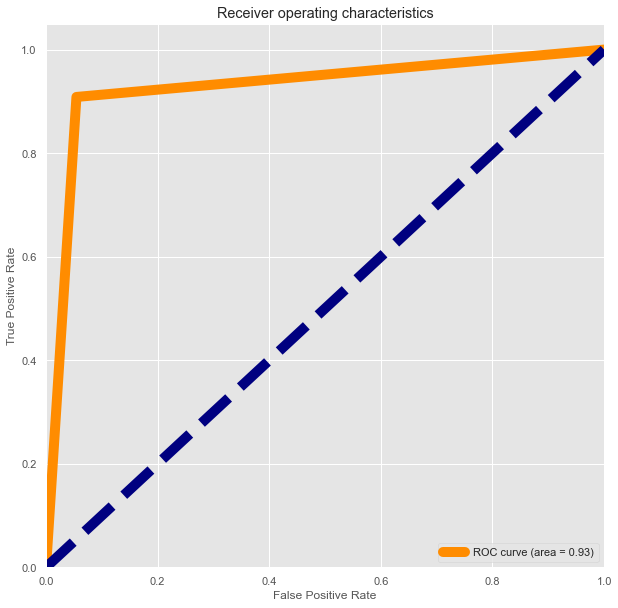

In [101]:
# ROC curve
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

### XGboost

In [102]:
#Finding the best random state

Accu=0
RS=0
for i in range(1,100):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2, random_state =i)
    xgb=XGBClassifier()
    xgb.fit(x_train, y_train)
    pred = xgb.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>Accu:
        Accu=acc
        RS=i
print("Best accuracy is ",Accu," on Random_state ",RS)

Best accuracy is  0.9366666666666666  on Random_state  17


In [103]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2, random_state = RS)

xgb.fit(x_train,y_train)
pred_test=xgb.predict(x_test)
pred_train=xgb.predict(x_train)
score_test=roc_auc_score(y_test,pred_test)
score_train=roc_auc_score(y_train,pred_train)
score_acc=accuracy_score(y_test,pred_test)
print('Accuracy test: ',score_acc)
print('Roc_Auc train: ',score_train)
print('Roc_Auc test: ',score_test)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,pred_test))
print('Classification Report: ','\n',classification_report(y_test,pred_test))
print('CV  : ',cross_val_score(xgb,x,y,cv=10).mean())

Accuracy test:  0.9366666666666666
Roc_Auc train:  1.0
Roc_Auc test:  0.9369747899159664
Confusion Matrix:  
 [[141  12]
 [  7 140]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.95      0.92      0.94       153
           1       0.92      0.95      0.94       147

    accuracy                           0.94       300
   macro avg       0.94      0.94      0.94       300
weighted avg       0.94      0.94      0.94       300

CV  :  0.8953333333333333


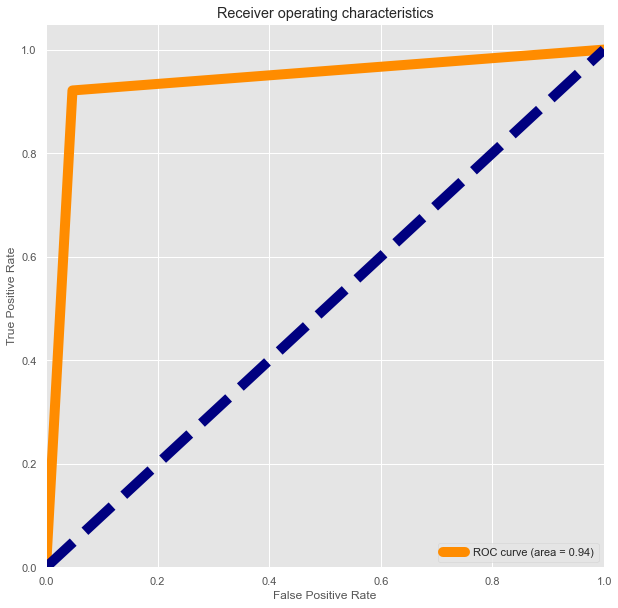

In [104]:
# ROC curve
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

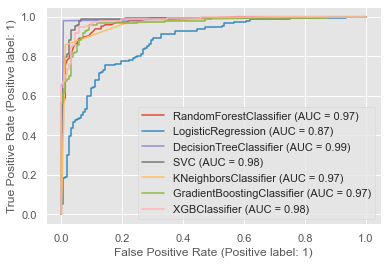

In [105]:
# Plotting AUC-ROC Curve for all the models used here 

disp = plot_roc_curve(rfc,x_test,y_test)
plot_roc_curve(lr, x_test, y_test, ax=disp.ax_)    
plot_roc_curve(dtc,x_test, y_test, ax=disp.ax_)
plot_roc_curve(svc, x_test, y_test, ax=disp.ax_)
plot_roc_curve(knn, x_test, y_test, ax=disp.ax_)
plot_roc_curve(gbc, x_test, y_test, ax=disp.ax_)
plot_roc_curve(xgb, x_test, y_test, ax=disp.ax_)

plt.legend(prop={'size':11}, loc='lower right')
plt.show()

-------------------------------------------------------------------------------------------------------------------------------

Chosse XGBClassifier to be my Model as it have (AUC: 98%)

Roc_Auc test:  93.7%

Accuracy test:  93.6%

CV :  89.5%

-------------------------------------------------------------------------------------------------------------------------------

#### Hyperparameter Tuning 

In [108]:
# tunning XGBClassifier

from sklearn.model_selection import RandomizedSearchCV

param_xgb={'learning_rate':[0.001,0.01,0.1],'n_estimators':[100,250,500,700,1000],'max_depth':[3,5,7,9],'subsample':[0.7,0.9,1],
           'colsample_bytree':[0.7,0.9,1],'min_child_weight':[1,3]}

xgb_model= RandomizedSearchCV(XGBClassifier(),param_xgb,n_iter=120,cv=10,n_jobs=-1,scoring='roc_auc',verbose=True).fit(x_train,y_train)

Fitting 10 folds for each of 120 candidates, totalling 1200 fits


In [109]:
xgb_model.best_params_

{'subsample': 0.7,
 'n_estimators': 1000,
 'min_child_weight': 1,
 'max_depth': 9,
 'learning_rate': 0.1,
 'colsample_bytree': 1}

In [110]:
xgb_model.best_score_

0.9546893272822699

In [111]:
xgb_model_final=XGBClassifier(learning_rate= 0.1,max_depth=9,colsample_bytree= 1,min_child_weight=1,n_estimators=1000,
                              subsample=0.7 , random_state=17).fit(x_train,y_train)

In [112]:
train_pred = xgb_model_final.predict(x_train)
test_pred = xgb_model_final.predict(x_test)

In [114]:
score_test=roc_auc_score(y_test,test_pred)
score_train=roc_auc_score(y_train,train_pred)
score_acc=accuracy_score(y_test,test_pred)
print('Accuracy test: ',score_acc)
print('Roc_Auc train: ',score_train)
print('Roc_Auc test: ',score_test)
print('Confusion Matrix: ' ,'\n',confusion_matrix(y_test,test_pred))
print('Classification Report: ','\n',classification_report(y_test,test_pred))
print('CV  : ',cross_val_score(xgb_model_final,x,y,cv=10).mean())

Accuracy test:  0.93
Roc_Auc train:  1.0
Roc_Auc test:  0.9303054555155396
Confusion Matrix:  
 [[140  13]
 [  8 139]]
Classification Report:  
               precision    recall  f1-score   support

           0       0.95      0.92      0.93       153
           1       0.91      0.95      0.93       147

    accuracy                           0.93       300
   macro avg       0.93      0.93      0.93       300
weighted avg       0.93      0.93      0.93       300

CV  :  0.8899999999999999


### The model is not enchaced it decrease a little bit may be because i used RandomizedSearch instead of GridSearchCV regarding the time consuming issue but so far the model is pretty goodso i will stick with xgb model before tunning.

-------------------------------------------------------------------------------------------------------------------------------

## Saving Model

In [115]:
#Saving the model using .pkl
import joblib
joblib.dump(xgb,"A_Insurance_Fraud.pkl")

['A_Insurance_Fraud.pkl']

<AxesSubplot:>

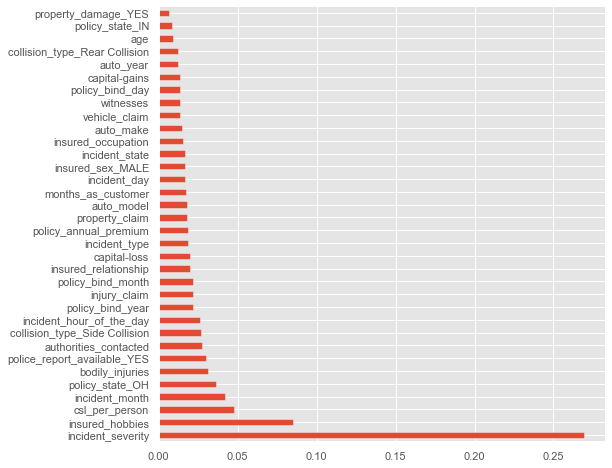

In [116]:
#Checking Feature Importance with XGB Model

feat_importances = pd.Series(xgb.feature_importances_, index=x.columns)
feat_importances.nlargest(100).plot(kind='barh',figsize=(8,8))

In [117]:
# load model and get predictions

model=joblib.load("A_Insurance_Fraud.pkl")

#Predict

prediction = model.predict(x_test)

prediction

array([1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0,
       1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0,
       0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0,
       1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0,
       1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1,
       0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0,
       0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1])

In [118]:
pd.DataFrame([model.predict(x_test)[:], y_test[:]], index = ['Predicted', 'Original'])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299
Predicted,1,1,1,1,1,1,1,0,1,0,1,1,1,1,0,0,1,1,0,0,1,0,1,1,0,1,1,1,1,0,1,1,1,0,0,1,1,0,0,0,0,1,1,1,0,0,0,0,1,1,0,1,1,1,1,1,1,1,1,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,1,1,1,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,1,1,1,0,1,1,1,1,1,1,0,1,1,1,1,0,1,1,1,1,1,0,0,0,0,1,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,1,1,1,0,1,0,0,0,1,1,0,1,0,0,0,1,1,1,0,0,0,1,0,1,0,0,1,1,1,1,0,1,1,0,1,0,1,1,0,1,0,0,0,1,0,1,1,1,1,0,0,1,0,0,1,1,1,0,1,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,1,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,1,1,0,0,0,0,0,0,1,0,1,0,0,0,1,1,0,1,1,1,1,1,0,0,1,1,0,1,0,1,1,1,0,1,1,1,1,0,0,0,1,1,1,0,1,1,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1
Original,1,1,1,1,1,1,1,0,0,0,1,1,1,1,0,0,1,1,0,0,1,0,1,1,0,1,1,1,1,0,1,1,1,0,0,1,1,0,0,0,0,1,1,1,0,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,1,1,1,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,1,1,1,0,1,1,1,0,1,1,0,1,1,1,1,0,1,1,1,1,1,0,0,0,0,1,0,1,1,1,0,0,0,1,0,0,0,0,0,1,0,1,1,1,0,1,0,0,0,1,0,0,1,0,0,0,1,1,1,0,0,0,1,0,1,0,0,1,1,0,1,1,0,1,0,0,0,1,1,0,1,0,0,0,1,0,1,1,1,1,0,0,1,0,0,1,1,1,0,1,1,0,0,0,0,1,0,1,1,0,0,1,0,0,1,0,0,1,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,1,1,0,0,0,0,0,0,1,0,1,1,0,0,1,1,0,1,1,0,1,1,0,0,1,1,0,1,0,1,1,1,0,1,1,0,1,0,1,0,1,1,1,0,1,1,0,1,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,0,1
